<h1 align="center"> Group Case Study - Telecom Churn </h1>

<h4 align="right"> By Shivani Raut, Sandeep Naukudkar and Sarat Shankar </h4>

## BUSINESS PROBLEM

In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.

For many incumbent operators, retaining high profitable customers is the number one business goal.

To reduce customer churn, telecom companies need to predict which customers are at high risk of churn.

In this project, you will analyse customer-level data of a leading telecom firm, build predictive models to identify customers at high risk of churn and identify the main indicators of churn.

## PROCESS
- Data Preprocessing: Cleaned the data, handled missing values, and engineered features to better represent the underlying patterns in the data.
- Identification of Most Valuable Customers: Identified customers who contribute the most value to your business, which can inform targeted retention efforts.
- Churner Tagging: Labelled customers who are likely to churn, a critical step in building a churn prediction model.
- Exploratory Data Analysis (EDA): EDA likely provided insights into the relationships between variables and the characteristics of churners, helping to inform feature selection and model building.
- Data Preparation: Split the data into training and test sets, addressed class imbalance using SMOTE, and applied robust scaling to handle outliers, setting a solid foundation for model training.
- Model Building: Chose logistic regression as your initial model and used Recursive Feature Elimination (RFE) to select the top 20 features. Manual tuning was performed to address multicollinearity and ensure the statistical significance of beta coefficients.
- Feature Importance: Finally, you determined the importance of features in predicting churn using the final logistic regression model.

In [1]:
# Suppressing Warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Importing required libraries
import pandas as pd, numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler 
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor 
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE, SelectFromModel
from sklearn import metrics
from sklearn.metrics import accuracy_score, recall_score, classification_report, confusion_matrix, roc_auc_score, roc_curve, precision_score, f1_score
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.metrics import r2_score
from sklearn.metrics import roc_auc_score
from sklearn.decomposition import PCA
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, KFold, cross_val_score
from sklearn.svm import SVC, LinearSVC
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from xgboost import XGBClassifier
from xgboost import plot_importance

In [3]:
# Setting option to display all columns
pd.set_option("display.max_columns",None)

## IMPORT THE DATASET

In [4]:
# Importing the data
churn_df = pd.read_csv("telecom_churn_data.csv")

# look at initial rows of the data
churn_df.head(10)

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,

## INSPECT AND UNDERSTAND THE DATA

We can do initial check of shape, describe, info.
We can identify if any duplicates, null values.

In [5]:
# Checking the shape of the dataframe
churn_df.shape

(99999, 226)

In [6]:
# Summary of descriptive statistics measures in the column
churn_df.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,9.999900e+04,99999.0,98981.0,98981.0,98981.0,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.0,96140.0,94621.0,92254.0,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621

In [7]:
# Display information about the DataFrame
churn_df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Data columns (total 226 columns):
 #    Column                    Dtype  
---   ------                    -----  
 0    mobile_number             int64  
 1    circle_id                 int64  
 2    loc_og_t2o_mou            float64
 3    std_og_t2o_mou            float64
 4    loc_ic_t2o_mou            float64
 5    last_date_of_month_6      object 
 6    last_date_of_month_7      object 
 7    last_date_of_month_8      object 
 8    last_date_of_month_9      object 
 9    arpu_6                    float64
 10   arpu_7                    float64
 11   arpu_8                    float64
 12   arpu_9                    float64
 13   onnet_mou_6               float64
 14   onnet_mou_7               float64
 15   onnet_mou_8               float64
 16   onnet_mou_9               float64
 17   offnet_mou_6              float64
 18   offnet_mou_7              float64
 19   offnet_mou_8              float64
 20   offn

In [8]:
# Creating a copy of the data to work and manipulate the data
df = churn_df.copy()

#Checking the copied dataset
df.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

In [9]:
# Checking for duplicate rows
print(df.duplicated().sum())

0


In [10]:
# Checking for null value count
df.isnull().sum().sort_values(ascending=False)

arpu_3g_6            74846
night_pck_user_6     74846
total_rech_data_6    74846
arpu_2g_6            74846
max_rech_data_6      74846
                     ...  
max_rech_amt_7           0
max_rech_amt_6           0
total_rech_amt_9         0
total_rech_amt_8         0
sep_vbc_3g               0
Length: 226, dtype: int64

We have found there are null values in columns, so, further we will check how to treat them.

In [11]:
# Checking for null value count
null_percentage = round(100*(df.isnull().sum().sort_values(ascending=False)/len(df)), 2)

# Creating a DataFrame
null_df = pd.DataFrame(null_percentage)

# Renaming the column
null_df.rename(columns={0: "Null_Percentage"}, inplace=True)

null_df

,Null_Percentage
arpu_3g_6,74.85
night_pck_user_6,74.85
total_rech_data_6,74.85
arpu_2g_6,74.85
max_rech_data_6,74.85
...,...
max_rech_amt_7,0.00
max_rech_amt_6,0.00
total_rech_amt_9,0.00
total_rech_amt_8,0.00


#### Many columns have more than 40% null value. This columns can be dropped later in this case study during DATA CLEANING part.

## FILTER HIGH VALUE CUSTOMERS

We need to predict churn only for the high-value customers. Define high-value customers as follows: Those who have recharged with an amount more than or equal to X, where X is the 70th percentile of the average recharge amount in the first two months (the good phase).

Total recharge data amount for the month can be derived from av_rech_amt_data and total_rech_data.

We can fill NaN with 0 for the rech_data and rech_amt_data for 6,7 and 8 months

In [12]:
# List of columns to replace NaN values with 0.0
col_replace = ['total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8', 'av_rech_amt_data_6', 'av_rech_amt_data_7', 'av_rech_amt_data_8']

# Replace NaN values with 0.0 in the specified columns
df[col_replace] = df[col_replace].fillna(0.0)

# Checking the replacement
df[col_replace].head()

,total_rech_data_6,total_rech_data_7,total_rech_data_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8
0,1.0,1.0,1.0,252.0,252.0,252.0
1,0.0,1.0,2.0,0.0,154.0,50.0
2,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0
4,1.0,0.0,0.0,56.0,0.0,0.0


#### Add new columns total_rech_amt_data and avg_rech_amt_data for 6, 7 and 8 months as they can be useful in this study

In [13]:
# Calculate total recharge amount for data for each month
df['total_rech_amt_data_6'] = df['av_rech_amt_data_6'] * df['total_rech_data_6']
df['total_rech_amt_data_7'] = df['av_rech_amt_data_7'] * df['total_rech_data_7']
df['total_rech_amt_data_8'] = df['av_rech_amt_data_8'] * df['total_rech_data_8']

In [14]:
# Checking the values
print("total_rech_amt_data_6", df['total_rech_amt_data_6'].head())
print("total_rech_amt_data_7", df['total_rech_amt_data_7'].head())
print("total_rech_amt_data_8", df['total_rech_amt_data_8'].head())

total_rech_amt_data_6 0    252.0
1      0.0
2      0.0
3      0.0
4     56.0
Name: total_rech_amt_data_6, dtype: float64
total_rech_amt_data_7 0    252.0
1    154.0
2      0.0
3      0.0
4      0.0
Name: total_rech_amt_data_7, dtype: float64
total_rech_amt_data_8 0    252.0
1    100.0
2      0.0
3      0.0
4      0.0
Name: total_rech_amt_data_8, dtype: float64


#### Total Average Recharge Amount For Good Phase Month

In [15]:
# Add total recharge amount for data to recharge amount for voice for June
df['rech_amt_data_6'] = df['total_rech_amt_6'] + df['total_rech_amt_data_6']

# Add total recharge amount for data to recharge amount for voice for July
df['rech_amt_data_7'] = df['total_rech_amt_7'] + df['total_rech_amt_data_7']

In [16]:
# Calculating the total average recharge amount of good phase months
df['total_avg_rech_amt_6n7'] = (df['rech_amt_data_6']+df['rech_amt_data_7']) /2

In [17]:
# Calculate the 70th percentile of the total average recharge amount in the good phase
X = df['total_avg_rech_amt_6n7'].quantile(0.7)

# Displaying the 70th percentile 
print(X)

478.0


In [18]:
# Filter high-value customers
df_hvc = df[df['total_avg_rech_amt_6n7'] >= X]

# Display the filtered high-value customers
print("High-value customers (70th percentile or above):", df_hvc.shape)

High-value customers (70th percentile or above): (30001, 232)


In [19]:
# Dropping the features created for the calculation
df_hvc = df_hvc.drop(['total_avg_rech_amt_6n7', 'rech_amt_data_6', 'rech_amt_data_7'], axis=1)

# Tag churners and remove attributes of the churn phase

Now tag the churned customers (churn=1, else 0) based on the fourth month as follows: Those who have not made any calls (either incoming or outgoing) AND have not used mobile internet even once in the churn phase. The attributes you need to use to tag churners are:

total_ic_mou_9

total_og_mou_9

vol_2g_mb_9

vol_3g_mb_9


After tagging churners, remove all the attributes corresponding to the churn phase (all attributes having ‘ _9’, etc. in their names).

In [20]:
# Selected columns from month - 9
mon_9 = ['total_ic_mou_9', 'total_og_mou_9', 'vol_2g_mb_9', 'vol_3g_mb_9']

In [21]:
# Checking Null percentage in month 9
null_percentage = round((df_hvc[mon_9].isnull().sum())*100, 2)
null_percentage

total_ic_mou_9    0
total_og_mou_9    0
vol_2g_mb_9       0
vol_3g_mb_9       0
dtype: int64

There are no null values in 9th month related columns.

In [22]:
# Tag churned customers
df_hvc['churn'] = np.where((df_hvc['total_ic_mou_9'] == 0) & 
                       (df_hvc['total_og_mou_9'] == 0) & 
                       (df_hvc['vol_2g_mb_9'] == 0) & 
                       (df_hvc['vol_3g_mb_9'] == 0), 1, 0)

df_hvc.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_rech_amt_data_6,total_rech_amt_data_7,total_rech_amt_data_8,churn
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN

In [23]:
# Remove attributes corresponding to the month-9 phase
cols_9 = [col for col in df_hvc.columns if '_9' in col]

# Dropping the columns
df_hvc.drop(cols_9, axis=1, inplace=True)

In [24]:
# Checking the shape
df_hvc.shape

(30001, 176)

In [25]:
# Checking the churned percentage
churned_percentage = round((df_hvc['churn'].sum()/len(df_hvc))*100, 2)

# Printing the churned percentage
print("Churned Percentage", churned_percentage)

Churned Percentage 8.14


## DATA CLEANING

We will now clean up the data for EDA phase of the study

In [26]:
# List of columns with null values
col_null = df_hvc.columns[df_hvc.isnull().any()].tolist()

# Checking the columns
col_null

['loc_og_t2o_mou',
 'std_og_t2o_mou',
 'loc_ic_t2o_mou',
 'last_date_of_month_7',
 'last_date_of_month_8',
 'onnet_mou_6',
 'onnet_mou_7',
 'onnet_mou_8',
 'offnet_mou_6',
 'offnet_mou_7',
 'offnet_mou_8',
 'roam_ic_mou_6',
 'roam_ic_mou_7',
 'roam_ic_mou_8',
 'roam_og_mou_6',
 'roam_og_mou_7',
 'roam_og_mou_8',
 'loc_og_t2t_mou_6',
 'loc_og_t2t_mou_7',
 'loc_og_t2t_mou_8',
 'loc_og_t2m_mou_6',
 'loc_og_t2m_mou_7',
 'loc_og_t2m_mou_8',
 'loc_og_t2f_mou_6',
 'loc_og_t2f_mou_7',
 'loc_og_t2f_mou_8',
 'loc_og_t2c_mou_6',
 'loc_og_t2c_mou_7',
 'loc_og_t2c_mou_8',
 'loc_og_mou_6',
 'loc_og_mou_7',
 'loc_og_mou_8',
 'std_og_t2t_mou_6',
 'std_og_t2t_mou_7',
 'std_og_t2t_mou_8',
 'std_og_t2m_mou_6',
 'std_og_t2m_mou_7',
 'std_og_t2m_mou_8',
 'std_og_t2f_mou_6',
 'std_og_t2f_mou_7',
 'std_og_t2f_mou_8',
 'std_og_t2c_mou_6',
 'std_og_t2c_mou_7',
 'std_og_t2c_mou_8',
 'std_og_mou_6',
 'std_og_mou_7',
 'std_og_mou_8',
 'isd_og_mou_6',
 'isd_og_mou_7',
 'isd_og_mou_8',
 'spl_og_mou_6',
 'spl_og_mou

We can drop mobile_number, circle_id columns as they we have no effect on case study.

In [27]:
# Removing the columns mobile_number, circle_id as they don't add any value to the model
col_to_drop = df_hvc.drop(['mobile_number', 'circle_id'], axis=1, inplace=True)

# Checking the data
df_hvc.head()

,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_rech_amt_data_6,total_rech_amt_data_7,total_rech_amt_data_8,churn
0,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,197.385,214.816,213.803,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.0,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.0,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,4.13,NaN,NaN,1.15,NaN,NaN,5.44,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.0,NaN,NaN,0.00,0.00,0.00,5.44,NaN,NaN,0.0,NaN,NaN,0.00,NaN,NaN,0.00,4,3,2,362,252,252,252,252,252,6/21/2014,7/16/2014,8/8/2014,252,252,252,6/21/2014,7/16/2014,8/8/2014,1.0,1.0,1.0,252.0,252.0,252.0,0.0,0.0,0.0,1.0,1.0,1.0,252.0,252.0,252.0,30.13,1.32,5.75,83.57,150.76,109.61,212.17,212.17,212.17,212.17,212.17,212.17,0.0,0.0,0.0,0,0,0,0,0,0,1,1,1,0,0,0,1.0,1.0,1.0,968,30.40,0.00,101.20,3.58,252.0,252.0,252.0,1
7,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,0.0,0.0,0.0,60.86,75.14,77.84,0.0,0.18,10.01,4.5,0.0,6.50,0.0,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,0.0,0.0,0.0,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,

#### Date Columns

In [28]:
# Find all columns containing the substring "date"
date_cols = [col for col in df_hvc.columns if 'date' in col]

# Print the data type of each column
for col in date_cols:
    print(f"Data type of '{col}': {df_hvc[col].dtype}")

Data type of 'last_date_of_month_6': object
Data type of 'last_date_of_month_7': object
Data type of 'last_date_of_month_8': object
Data type of 'date_of_last_rech_6': object
Data type of 'date_of_last_rech_7': object
Data type of 'date_of_last_rech_8': object
Data type of 'date_of_last_rech_data_6': object
Data type of 'date_of_last_rech_data_7': object
Data type of 'date_of_last_rech_data_8': object


#### Numerical Columns

In [29]:
# Find the numerical columns 
num_col = df_hvc.select_dtypes(include=['int', 'float']).columns

# Displaying the numerical columns
num_col

Index(['loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'arpu_6',
       'arpu_7', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8',
       'offnet_mou_6',
       ...
       'fb_user_8', 'aon', 'aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g',
       'sep_vbc_3g', 'total_rech_amt_data_6', 'total_rech_amt_data_7',
       'total_rech_amt_data_8', 'churn'],
      dtype='object', length=165)

In [30]:
# List of columns with null values
num_col_null = round(df_hvc[num_col].isnull().sum()/len(df_hvc)*100, 2)

# Checking the columns
num_col_null

loc_og_t2o_mou           0.75
std_og_t2o_mou           0.75
loc_ic_t2o_mou           0.75
arpu_6                   0.00
arpu_7                   0.00
                         ... 
sep_vbc_3g               0.00
total_rech_amt_data_6    0.00
total_rech_amt_data_7    0.00
total_rech_amt_data_8    0.00
churn                    0.00
Length: 165, dtype: float64

#### Columns with <40% null values

We have drop the columns where null percentage is greater than 40%.

In [31]:
# Dropping the columns with higher than 40% null

# List of columns with null percentage greater than 40%
columns_to_drop = num_col_null[num_col_null > 40].index
columns_to_drop

Index(['max_rech_data_6', 'max_rech_data_7', 'max_rech_data_8',
       'count_rech_2g_6', 'count_rech_2g_7', 'count_rech_2g_8',
       'count_rech_3g_6', 'count_rech_3g_7', 'count_rech_3g_8', 'arpu_3g_6',
       'arpu_3g_7', 'arpu_3g_8', 'arpu_2g_6', 'arpu_2g_7', 'arpu_2g_8',
       'night_pck_user_6', 'night_pck_user_7', 'night_pck_user_8', 'fb_user_6',
       'fb_user_7', 'fb_user_8'],
      dtype='object')

In [32]:
# Drop the columns from the DataFrame
df_hvc.drop(columns=columns_to_drop, inplace=True)

# Checking the shape
df_hvc.shape

(30001, 153)

#### Columns with  Null < 40%

For the null values < 40% in numerical coulmns, we will fill them with 0.

In [33]:
# Find the numerical columns 
num_col = df_hvc.select_dtypes(include=['int', 'float']).columns

# Displaying the categorical columns
num_col

Index(['loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'arpu_6',
       'arpu_7', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8',
       'offnet_mou_6',
       ...
       'sachet_3g_8', 'aon', 'aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g',
       'sep_vbc_3g', 'total_rech_amt_data_6', 'total_rech_amt_data_7',
       'total_rech_amt_data_8', 'churn'],
      dtype='object', length=144)

In [34]:
# List of columns with null values
num_col_null = round(df_hvc[num_col].isnull().sum()/len(df_hvc)*100, 2)

# Checking the columns
num_col_null

loc_og_t2o_mou           0.75
std_og_t2o_mou           0.75
loc_ic_t2o_mou           0.75
arpu_6                   0.00
arpu_7                   0.00
                         ... 
sep_vbc_3g               0.00
total_rech_amt_data_6    0.00
total_rech_amt_data_7    0.00
total_rech_amt_data_8    0.00
churn                    0.00
Length: 144, dtype: float64

In [35]:
# Filling null values with 0.0
df_hvc[num_col] = df_hvc[num_col].fillna(0.0)

# Checking the data
df_hvc[num_col]

,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_rech_amt_data_6,total_rech_amt_data_7,total_rech_amt_data_8,churn
0,0.0,0.0,0.0,197.385,214.816,213.803,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.16,0.00,0.00,4.13,0.00,0.00,1.15,0.00,0.00,5.44,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,5.44,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,4,3,2,362,252,252,252,252,252,252,252,252,1.0,1.0,1.0,252.0,252.0,252.0,30.13,1.32,5.75,83.57,150.76,109.61,0,0,0,0,0,0,1,1,1,0,0,0,968,30.40,0.00,101.20,3.58,252.0,252.0,252.0,1
7,0.0,0.0,0.0,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.00,0.00,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,0.0,0.0,0.0,60.86,75.14,77.84,0.0,0.18,10.01,4.50,0.00,6.50,0.00,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,0.0,0.0,0.0,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,3638,1580,790,1580,0,0,779,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,0.00,0.0,0.0,0.0,1
8,0.0,0.0,0.0,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.00,0.00,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,0.0,0.0,0.0,130.26,143.48,98.28,0.0,0.00,0.00,0.00,0.00,10.23,0.00,0.0,0.0,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,81.43,23.83,15.79,0.00,0.58,0.10,22.43,4.08,0.65,0.00,0.00,0

#### Categorical Columns

In [36]:
# Find the categorical columns 
cat_col = df_hvc.select_dtypes(include=['object', 'category']).columns

# Displaying the categorical columns
cat_col

Index(['last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8',
       'date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8',
       'date_of_last_rech_data_6', 'date_of_last_rech_data_7',
       'date_of_last_rech_data_8'],
      dtype='object')

In [37]:
# List of columns with null values
cat_col_null = round(df_hvc[cat_col].isnull().sum()/len(df_hvc)*100, 2)

# Checking the columns
cat_col_null

last_date_of_month_6         0.00
last_date_of_month_7         0.09
last_date_of_month_8         0.55
date_of_last_rech_6          0.24
date_of_last_rech_7          0.33
date_of_last_rech_8          1.94
date_of_last_rech_data_6    44.15
date_of_last_rech_data_7    43.15
date_of_last_rech_data_8    46.83
dtype: float64

In [38]:
# Dropping the columns with higher than 40% null

# List of columns with null percentage greater than 40%
columns_to_drop = cat_col_null[cat_col_null > 40].index
columns_to_drop

Index(['date_of_last_rech_data_6', 'date_of_last_rech_data_7',
       'date_of_last_rech_data_8'],
      dtype='object')

In [39]:
# Drop the columns from the DataFrame
df_hvc.drop(columns=columns_to_drop, inplace=True)

# Checking the shape
df_hvc.shape

(30001, 150)

In [40]:
# Find the categorical columns 
cat_col = df_hvc.select_dtypes(include=['object', 'category']).columns

# Displaying the categorical columns
cat_col

Index(['last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8',
       'date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8'],
      dtype='object')

In [41]:
# List of columns with null values
cat_col_null = round(df_hvc[cat_col].isnull().sum()/len(df_hvc)*100, 2)

# Checking the columns
cat_col_null

last_date_of_month_6    0.00
last_date_of_month_7    0.09
last_date_of_month_8    0.55
date_of_last_rech_6     0.24
date_of_last_rech_7     0.33
date_of_last_rech_8     1.94
dtype: float64

### Columns with 1 Unique Value

We can check on unique value columns and drop them as they may not have relevance in the case study.

In [42]:
# Checking number of unique values in each column
unique_count = df_hvc.nunique().sort_values(ascending=True)

# Displaying columns
unique_count

loc_og_t2o_mou              1
std_og_t2o_mou              1
loc_ic_t2o_mou              1
last_date_of_month_6        1
last_date_of_month_7        1
                        ...  
total_og_mou_6          23519
total_og_mou_7          23684
arpu_8                  28073
arpu_6                  29072
arpu_7                  29084
Length: 150, dtype: int64

In [43]:
# Selecting columns where the number of unique values is 1
columns_1_unique_value = unique_count[unique_count == 1].index

# Displaying columns with one unique value
print(columns_1_unique_value)

Index(['loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou',
       'last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8',
       'std_ic_t2o_mou_8', 'std_ic_t2o_mou_7', 'std_ic_t2o_mou_6',
       'std_og_t2c_mou_8', 'std_og_t2c_mou_7', 'std_og_t2c_mou_6'],
      dtype='object')


In [44]:
# Dropping the columns with only one unique value 
df_hvc.drop(columns_1_unique_value, axis=1, inplace=True)

# Checking the dataframe
df_hvc.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_rech_amt_data_6,total_rech_amt_data_7,total_rech_amt_data_8,churn
0,197.385,214.816,213.803,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.16,0.00,0.00,4.13,0.00,0.00,1.15,0.00,0.00,5.44,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5.44,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,4,3,2,362,252,252,252,252,252,6/21/2014,7/16/2014,8/8/2014,252,252,252,1.0,1.0,1.0,252.0,252.0,252.0,30.13,1.32,5.75,83.57,150.76,109.61,0,0,0,0,0,0,1,1,1,0,0,0,968,30.40,0.00,101.20,3.58,252.0,252.0,252.0,1
7,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,60.86,75.14,77.84,0.0,0.18,10.01,4.5,0.0,6.50,0.0,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,3638,1580,790,1580,6/27/2014,7/25/2014,8/26/2014,0,0,779,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,0.00,0.0,0.0,0.0,1
8,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,130.26,143.48,98.28,0.0,0.00,0.00,0.0,0.0,10.23,0.0,0.0,0.0,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,81.43,23.83,15.79,0.00,0.58,0.10,22.43,4.08,0.65,0.00,0.00,0.00,22.43,4.66,0.75,103.86,28.49,16.54,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,19,21,14,437,601,120,90,154,30,6/25/2014,7/31/2014,8/30/2

In [45]:
# Checking the shape
df_hvc.shape

(30001, 138)

## EDA

### DERIVING NEW FEATURES

#### Introduce aon_month column to get idea how many months the customer on network to see we can use this feature to derive the range for EDA later in this case.

In [46]:
# Calculate the months the customer is on the network by column 'aon'
df_hvc['aon_month'] = df_hvc['aon']/30

# Checking the aon_month values
df_hvc['aon_month']

0        32.266667
7        26.733333
8        10.500000
21       24.000000
23       20.133333
           ...    
99981    15.766667
99984    27.333333
99986    89.866667
99988    10.933333
99997    15.933333
Name: aon_month, Length: 30001, dtype: float64

#### Introduce range for years on network column to get idea how many months the customer on network to see we can use this feature in study.

In [47]:
# Define the ranges and corresponding labels
ranges = [0, 6, 12, 24, 60, np.inf]
labels = ['0-6 Months', '6-12 Months', '1-2 Yrs', '2-5 Yrs', '5+ Yrs']

# Create a new column 'aon_range' by binning the 'aon_month' column
df_hvc['aon_range'] = pd.cut(df_hvc['aon_month'], bins=ranges, labels=labels)

# Display the first few rows of the new column to verify the changes
print(df_hvc['aon_range'].head())

0         2-5 Yrs
7         2-5 Yrs
8     6-12 Months
21        1-2 Yrs
23        1-2 Yrs
Name: aon_range, dtype: category
Categories (5, object): ['0-6 Months' < '6-12 Months' < '1-2 Yrs' < '2-5 Yrs' < '5+ Yrs']


#### We can drop the aon and aon_month columns as we have created a range for this.

In [48]:
# Dropping 'aon_month'
df_hvc = df_hvc.drop(['aon_month'], axis=1)

# Checking the data
df_hvc.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_rech_amt_data_6,total_rech_amt_data_7,total_rech_amt_data_8,churn,aon_range
0,197.385,214.816,213.803,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.16,0.00,0.00,4.13,0.00,0.00,1.15,0.00,0.00,5.44,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5.44,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,4,3,2,362,252,252,252,252,252,6/21/2014,7/16/2014,8/8/2014,252,252,252,1.0,1.0,1.0,252.0,252.0,252.0,30.13,1.32,5.75,83.57,150.76,109.61,0,0,0,0,0,0,1,1,1,0,0,0,968,30.40,0.00,101.20,3.58,252.0,252.0,252.0,1,2-5 Yrs
7,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,60.86,75.14,77.84,0.0,0.18,10.01,4.5,0.0,6.50,0.0,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,3638,1580,790,1580,6/27/2014,7/25/2014,8/26/2014,0,0,779,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,0.00,0.0,0.0,0.0,1,2-5 Yrs
8,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,130.26,143.48,98.28,0.0,0.00,0.00,0.0,0.0,10.23,0.0,0.0,0.0,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,81.43,23.83,15.79,0.00,0.58,0.10,22.43,4.08,0.65,0.00,0.00,0.00,22.43,4.66,0.75,103.86,28.49,16.54,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,19,21,14,437,601,120,90,154,30,

#### The revenue per user in good phase can be combined in one feature and individual features can be dropped.

In [49]:
# The average revenue per user is good phase of customer is given by arpu_6 and arpu_7. Since we have two seperate averages, lets take an average to these two and drop the other columns.

df_hvc["avg_arpu_6n7"]= round(((df_hvc['arpu_6'] + df_hvc['arpu_7'])/2), 2)

df_hvc['avg_arpu_6n7'].head()

0      206.10
7     1209.51
8      435.47
21     556.10
23     134.12
Name: avg_arpu_6n7, dtype: float64

#### Introduce new column to record average revenue per user which include 6,7 and 8th month

In [50]:
# The average revenue per user

df_hvc["avg_arpu"]= round(((df_hvc['arpu_6'] + df_hvc['arpu_7'] + df_hvc['arpu_8'])/3), 2)

df_hvc['avg_arpu'].head()

0      208.67
7     1863.50
8      336.10
21     583.32
23     211.74
Name: avg_arpu, dtype: float64

In [51]:
# Dropping the original columns
df_hvc.drop(['arpu_6','arpu_7'], axis=1, inplace=True)

# Checking the shape
df_hvc.shape

(30001, 139)

#### Set format for date columns

In [52]:
# Convert date columns to datetime format
date_cols = ['date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8']
for col in date_cols:
    df_hvc[col] = pd.to_datetime(df_hvc[col], format='%m/%d/%Y')

# Find the maximum date among the columns for each customer
df_hvc['last_rech_date'] = df_hvc[date_cols].max(axis=1)

# Define the end date of the churn phase
end_of_churn_phase = pd.to_datetime('09/30/2014', format='%m/%d/%Y')

# Calculate time elapsed since the last recharge or data usage event
df_hvc['days_since_last_rech'] = (end_of_churn_phase - df_hvc['last_rech_date']).dt.days

# Drop intermediate columns if needed
df_hvc.drop(columns=date_cols + ['last_rech_date'], inplace=True)

#### Creating categorical column based on number and data of 8th month

In [53]:
# Creating categories for month 8 column total recharge data and their count
df_hvc['total_rech_data_group_8'] = pd.cut(df_hvc['total_rech_data_8'], 
                                            [-1, 0, 10, 25, 100],
                                            labels=["No Recharge", "Less than 10 Recharges", "10-25 Recharges", "More than 25 Recharges"])

# Creating categories for month 8 column total recharge number and their count
df_hvc['total_rech_num_group_8'] = pd.cut(df_hvc['total_rech_num_8'], 
                                           [-1, 0, 10, 25, 1000], 
                                           labels=["No Recharge", "Less than 10 Recharges", "10-25 Recharges", "More than 25 Recharges"])


### DATA IMBALANCE CHECK

In [54]:
# Checking values in Churn column
df_hvc.churn.unique()

array([1, 0])

In [55]:
# Count of values in Churn column
df_hvc.churn.value_counts(normalize=True)

churn
0    0.918636
1    0.081364
Name: proportion, dtype: float64

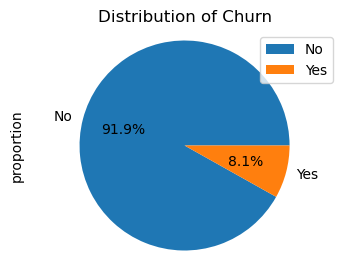

In [56]:
# Plotting the pie chart of Converted
# Adjusting figure size
plt.figure(figsize=(4, 3))

# Adding labels
label = ['No', 'Yes']

# Plotting the pie chart
df_hvc['churn'].value_counts(normalize=True).plot(kind='pie',  labels=label, autopct='%1.1f%%')

# Adding title
plt.title("Distribution of Churn")

# Adjusting legend position
plt.legend(loc="upper right")

# Ensuring aspect ratio is equal to create a perfect circle
plt.axis('equal')

# Displaying the graph
plt.show()

In our data, 91% of the customers do not churn. Clearly the data is skewed as we would expect a large majority of the customers to not churn.  

In [57]:
# Calculate the Imbalance Ratio
Imbalance_Ratio = df_hvc["churn"].value_counts(normalize=True).loc[0] / df_hvc["churn"].value_counts(normalize=True).loc[1]

# Print the imbalance ratio
print("Data Imbalance Ratio- {:.2f} : {}".format(Imbalance_Ratio, 1))

Data Imbalance Ratio- 11.29 : 1


## UNIVARIATE AND BIVARIANT ANALYSIS - CATEGORICAL VARIABLES

In [58]:
# Find the categorical columns 
cat_col = df_hvc.select_dtypes(include=['category']).columns

# Displaying the categorical columns
cat_col

Index(['aon_range', 'total_rech_data_group_8', 'total_rech_num_group_8'], dtype='object')

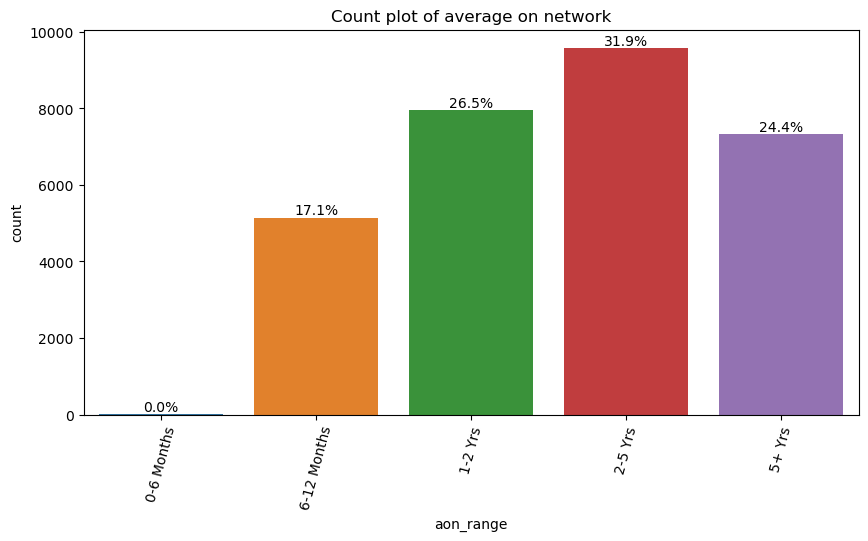

In [59]:
# Create a new figure
plt.figure(figsize=[10,5])
    
# Set title of the plot
#plt.title("Count plot of {}".format(i))

plt.title("Count plot of average on network")

# Create countplot
ax = sns.countplot(x=df_hvc['aon_range'], data=df_hvc)
    
# Calculate total count for percentage calculation
total = len(df_hvc['aon_range'])
    
# Rotate x-axis labels
plt.xticks(rotation=75)
    
# Annotate each bar with its percentage value
for p in ax.patches:
    text = '{:.1f}%'.format(100 * p.get_height()/ total)
    x = p.get_x() + p.get_width()/ 2.
    y = p.get_height()
    ax.annotate(text, (x, y), ha='center', va='center', xytext=(0, 5), textcoords='offset points')

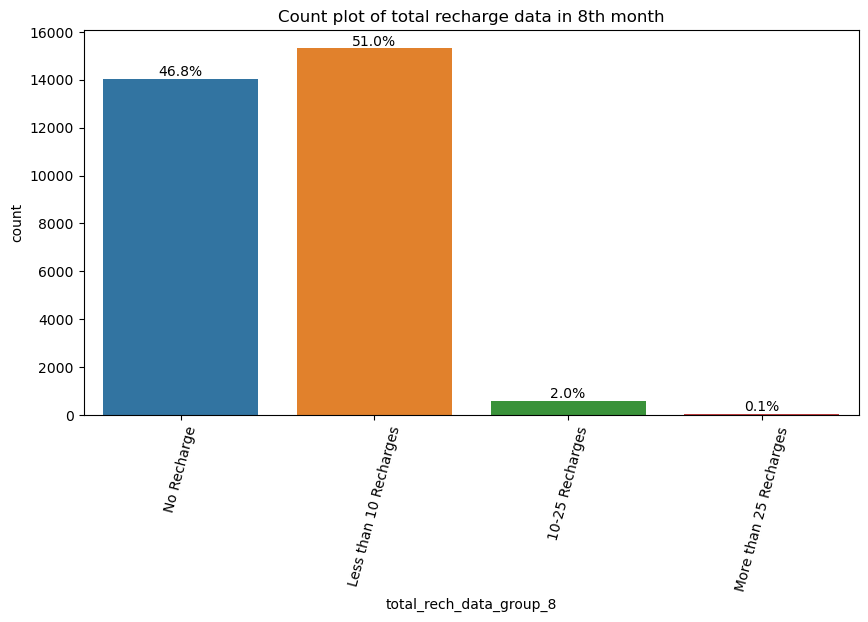

In [60]:
# Create a new figure
plt.figure(figsize=[10,5])
    
# Set title of the plot
#plt.title("Count plot of {}".format(i))

plt.title("Count plot of total recharge data in 8th month")

# Create countplot
ax = sns.countplot(x=df_hvc['total_rech_data_group_8'], data=df_hvc)
    
# Calculate total count for percentage calculation
total = len(df_hvc['total_rech_data_group_8'])
    
# Rotate x-axis labels
plt.xticks(rotation=75)
    
# Annotate each bar with its percentage value
for p in ax.patches:
    text = '{:.1f}%'.format(100 * p.get_height()/ total)
    x = p.get_x() + p.get_width()/ 2.
    y = p.get_height()
    ax.annotate(text, (x, y), ha='center', va='center', xytext=(0, 5), textcoords='offset points')

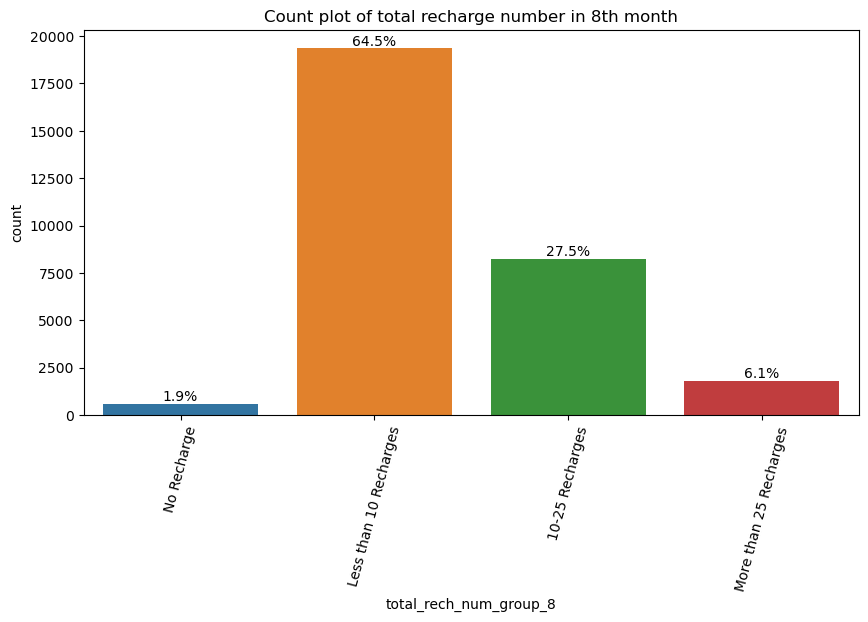

In [61]:
# Create a new figure
plt.figure(figsize=[10,5])
    
# Set title of the plot
#plt.title("Count plot of {}".format(i))

plt.title("Count plot of total recharge number in 8th month")

# Create countplot
ax = sns.countplot(x=df_hvc['total_rech_num_group_8'], data=df_hvc)
    
# Calculate total count for percentage calculation
total = len(df_hvc['total_rech_num_group_8'])
    
# Rotate x-axis labels
plt.xticks(rotation=75)
    
# Annotate each bar with its percentage value
for p in ax.patches:
    text = '{:.1f}%'.format(100 * p.get_height()/ total)
    x = p.get_x() + p.get_width()/ 2.
    y = p.get_height()
    ax.annotate(text, (x, y), ha='center', va='center', xytext=(0, 5), textcoords='offset points')

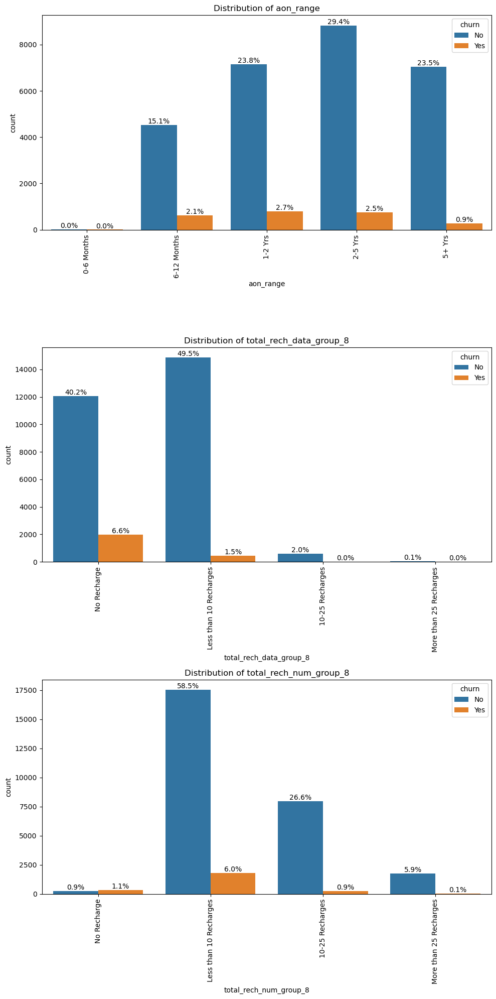

In [62]:
# Calculate the number of rows and columns needed for subplots
num_cols = 1
num_rows = len(cat_col)

# Create subplots
plt.figure(figsize=(10, 20))

# Iterate through categorical columns
for index, col in enumerate(cat_col, 1):
    # Creating subplots
    plt.subplot(num_rows, num_cols, index)
    
    # PLot title
    plt.title("Distribution of {}".format(col))
    
    # Plot countplot for distribution
    ax = sns.countplot(x=col, hue="churn", data=df_hvc)
    
    # Calculate total count for percentage calculation
    total = len(df_hvc[col])
    
    # Rotating the x-axis values
    plt.xticks(rotation=90)
    
    # Adding legend and it's title
    plt.legend(["No", "Yes"], title="churn")
    
    # Annotate each bar with its percentage value
    for p in ax.patches:
        text = '{:.1f}%'.format(100 * p.get_height() / total)
        x = p.get_x() + p.get_width() / 2.
        y = p.get_height()
        ax.annotate(text, (x, y), ha='center', va='center', xytext=(0, 5), textcoords='offset points')

# Adjust layout and display the plot
plt.tight_layout()

# Displaying the graph
plt.show()

We see that  50% of our customers who are on network between 2-5 and +

## UNIVARIANT AND BIVARIANT ANALYSIS - NUMERICAL VARIABLES

In [63]:
# Creating a list of all numerical columns
num_col = df_hvc.select_dtypes(include=['int', 'float']).columns.to_list()
num_col

['arpu_8',
 'onnet_mou_6',
 'onnet_mou_7',
 'onnet_mou_8',
 'offnet_mou_6',
 'offnet_mou_7',
 'offnet_mou_8',
 'roam_ic_mou_6',
 'roam_ic_mou_7',
 'roam_ic_mou_8',
 'roam_og_mou_6',
 'roam_og_mou_7',
 'roam_og_mou_8',
 'loc_og_t2t_mou_6',
 'loc_og_t2t_mou_7',
 'loc_og_t2t_mou_8',
 'loc_og_t2m_mou_6',
 'loc_og_t2m_mou_7',
 'loc_og_t2m_mou_8',
 'loc_og_t2f_mou_6',
 'loc_og_t2f_mou_7',
 'loc_og_t2f_mou_8',
 'loc_og_t2c_mou_6',
 'loc_og_t2c_mou_7',
 'loc_og_t2c_mou_8',
 'loc_og_mou_6',
 'loc_og_mou_7',
 'loc_og_mou_8',
 'std_og_t2t_mou_6',
 'std_og_t2t_mou_7',
 'std_og_t2t_mou_8',
 'std_og_t2m_mou_6',
 'std_og_t2m_mou_7',
 'std_og_t2m_mou_8',
 'std_og_t2f_mou_6',
 'std_og_t2f_mou_7',
 'std_og_t2f_mou_8',
 'std_og_mou_6',
 'std_og_mou_7',
 'std_og_mou_8',
 'isd_og_mou_6',
 'isd_og_mou_7',
 'isd_og_mou_8',
 'spl_og_mou_6',
 'spl_og_mou_7',
 'spl_og_mou_8',
 'og_others_6',
 'og_others_7',
 'og_others_8',
 'total_og_mou_6',
 'total_og_mou_7',
 'total_og_mou_8',
 'loc_ic_t2t_mou_6',
 'loc_ic_t2

In [64]:
# Find all columns containing the substring "arpu_"
arpu_cols = [col for col in df_hvc.columns if 'arpu' in col]

# Print the list of columns
print(arpu_cols)

['arpu_8', 'avg_arpu_6n7', 'avg_arpu']


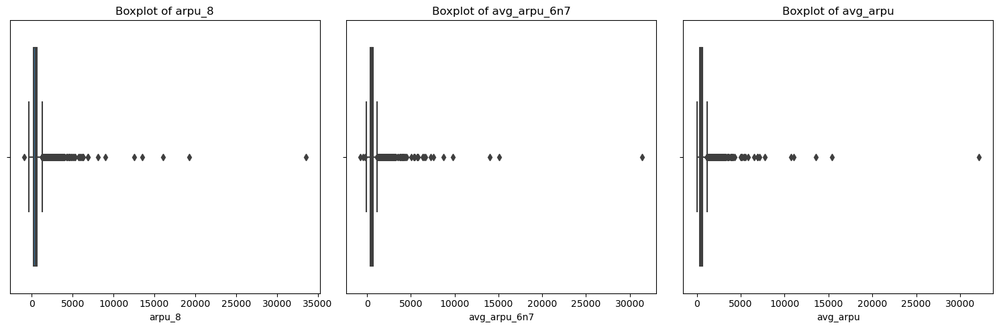

In [65]:
# Create subplots
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5))

# Enumerate through the columns and create boxplots
for i, col in enumerate(arpu_cols):
    sns.boxplot(x=df_hvc[col], orient='h', ax=axes[i])
    axes[i].set_title(f"Boxplot of {col}")

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plots
plt.show()

<Figure size 1400x800 with 0 Axes>

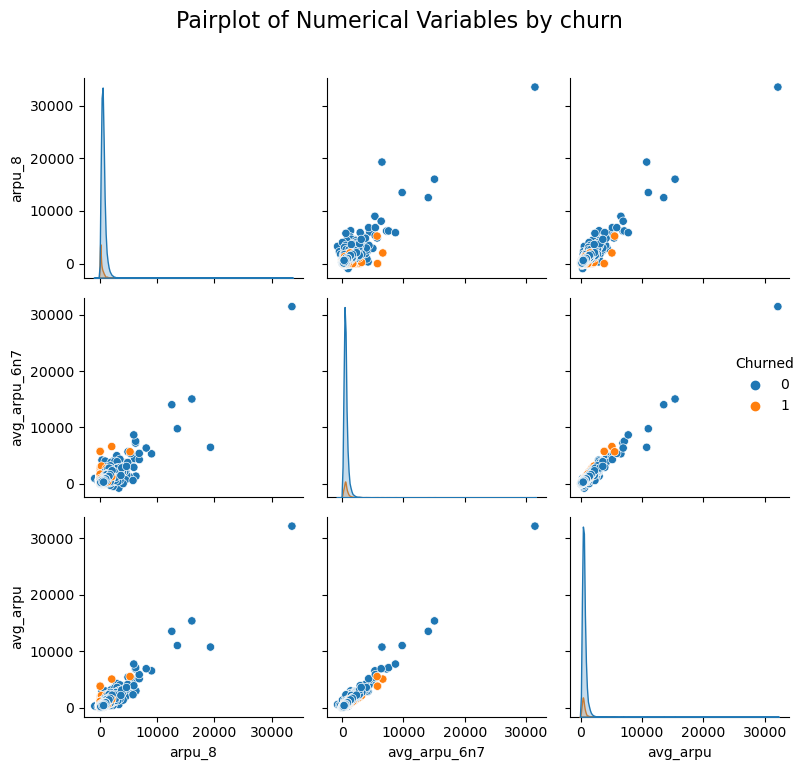

In [66]:
# PAIRPLOT
# Set the figure size and style
plt.figure(figsize=(14, 8))

# Create pairplot with customized appearance
pair_plot = sns.pairplot(data=df_hvc, vars=arpu_cols, hue="churn")

# Set titles for the pairplot and legend
pair_plot.fig.suptitle("Pairplot of Numerical Variables by churn", y=1.02, fontsize=16)
pair_plot._legend.set_title("Churned")

# Adjust layout and display the plot
plt.tight_layout()

# Displaying the graph
plt.show()

In [67]:
# Find all columns containing the substring "onnet_"
onnet_cols = [col for col in df_hvc.columns if 'onnet' in col]

# Print the list of columns
print(onnet_cols)

['onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8']


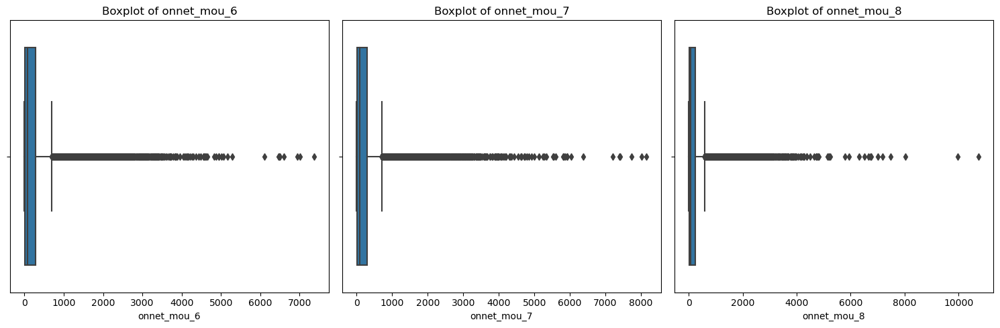

In [68]:
# Create subplots
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5))

# Enumerate through the columns and create boxplots
for i, col in enumerate(onnet_cols):
    sns.boxplot(x=df_hvc[col], orient='h', ax=axes[i])
    axes[i].set_title(f"Boxplot of {col}")

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plots
plt.show()

<Figure size 1400x800 with 0 Axes>

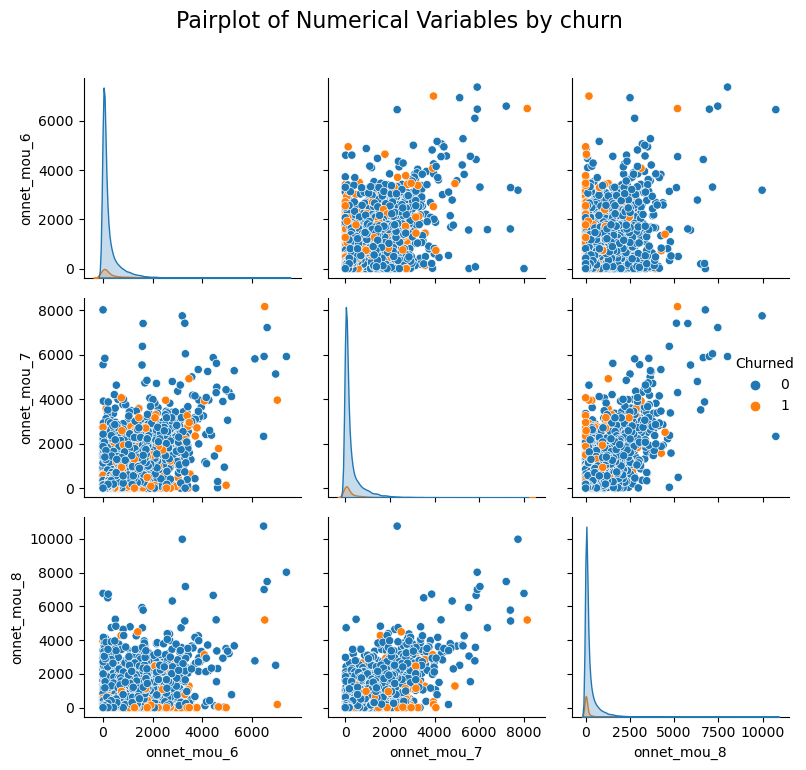

In [69]:
# PAIRPLOT
# Set the figure size and style
plt.figure(figsize=(14, 8))

# Create pairplot with customized appearance
pair_plot = sns.pairplot(data=df_hvc, vars=onnet_cols, hue="churn")

# Set titles for the pairplot and legend
pair_plot.fig.suptitle("Pairplot of Numerical Variables by churn", y=1.02, fontsize=16)
pair_plot._legend.set_title("Churned")

# Adjust layout and display the plot
plt.tight_layout()

# Displaying the graph
plt.show()

In [70]:
# Find all columns containing the substring "offnet_"
offnet_cols = [col for col in df_hvc.columns if 'offnet' in col]

# Print the list of columns
print(offnet_cols)

['offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8']


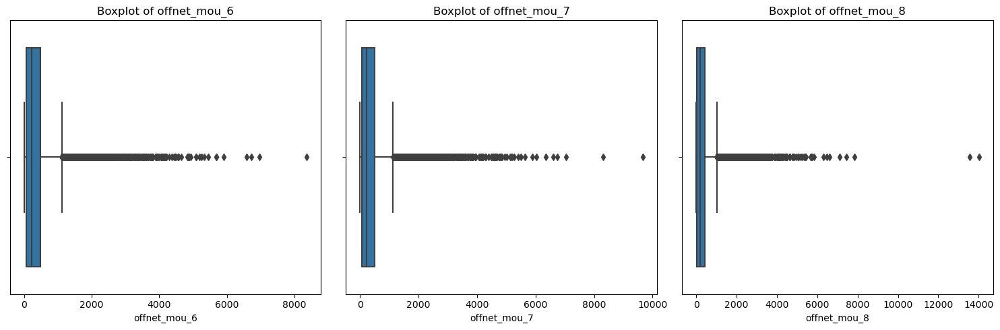

In [71]:
# Create subplots
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5))

# Enumerate through the columns and create boxplots
for i, col in enumerate(offnet_cols):
    sns.boxplot(x=df_hvc[col], orient='h', ax=axes[i])
    axes[i].set_title(f"Boxplot of {col}")

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plots
plt.show()

<Figure size 1400x800 with 0 Axes>

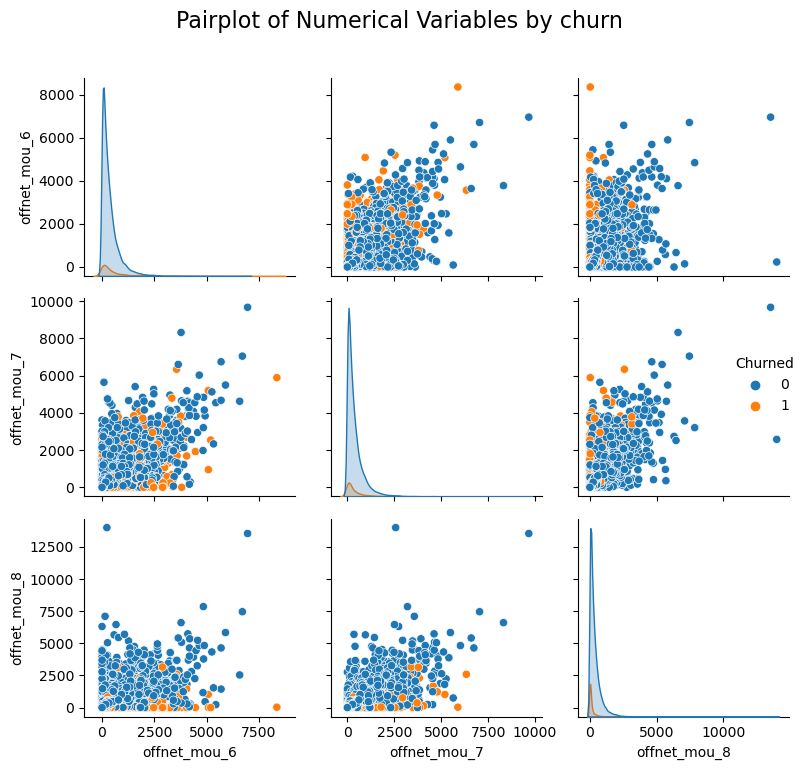

In [72]:
# PAIRPLOT
# Set the figure size and style
plt.figure(figsize=(14, 8))

# Create pairplot with customized appearance
pair_plot = sns.pairplot(data=df_hvc, vars=offnet_cols, hue="churn")

# Set titles for the pairplot and legend
pair_plot.fig.suptitle("Pairplot of Numerical Variables by churn", y=1.02, fontsize=16)
pair_plot._legend.set_title("Churned")

# Adjust layout and display the plot
plt.tight_layout()

# Displaying the graph
plt.show()

In [73]:
# Find all columns containing the substring roam_"
roam_cols = [col for col in df_hvc.columns if 'roam' in col]

# Print the list of columns
print(roam_cols)

# Print the length 
print('Count:', len(roam_cols))

['roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8']
Count: 6


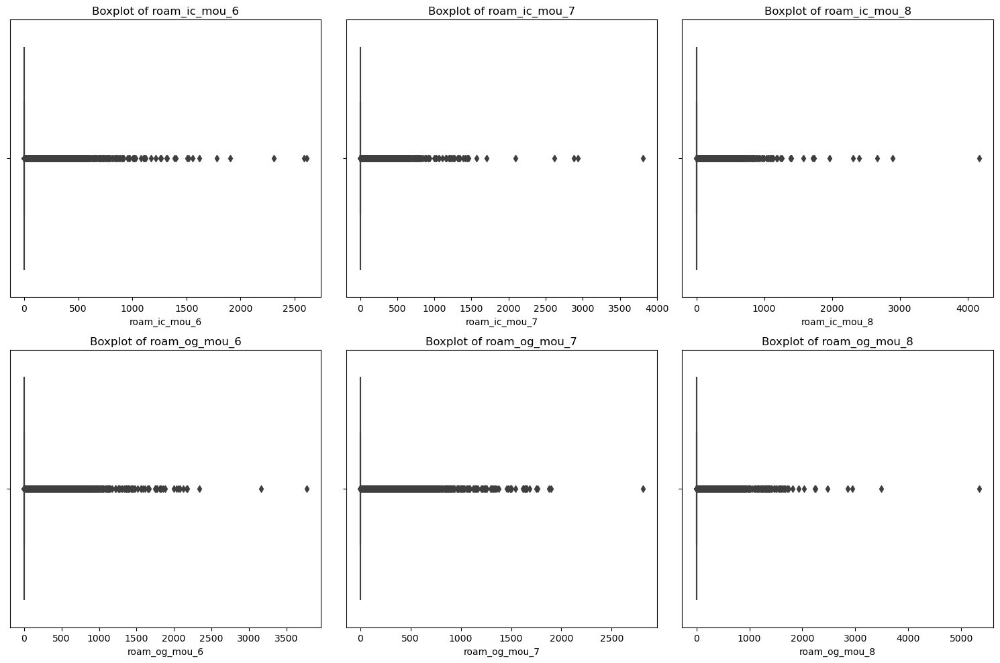

In [74]:
# Create subplots
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))

# Enumerate through the columns and create boxplots
for i, col in enumerate(roam_cols):
    sns.boxplot(x=df_hvc[col], orient='h', ax=axes[i//3, i%3])
    axes[i//3, i%3].set_title(f"Boxplot of {col}")

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plots
plt.show()

<Figure size 1400x800 with 0 Axes>

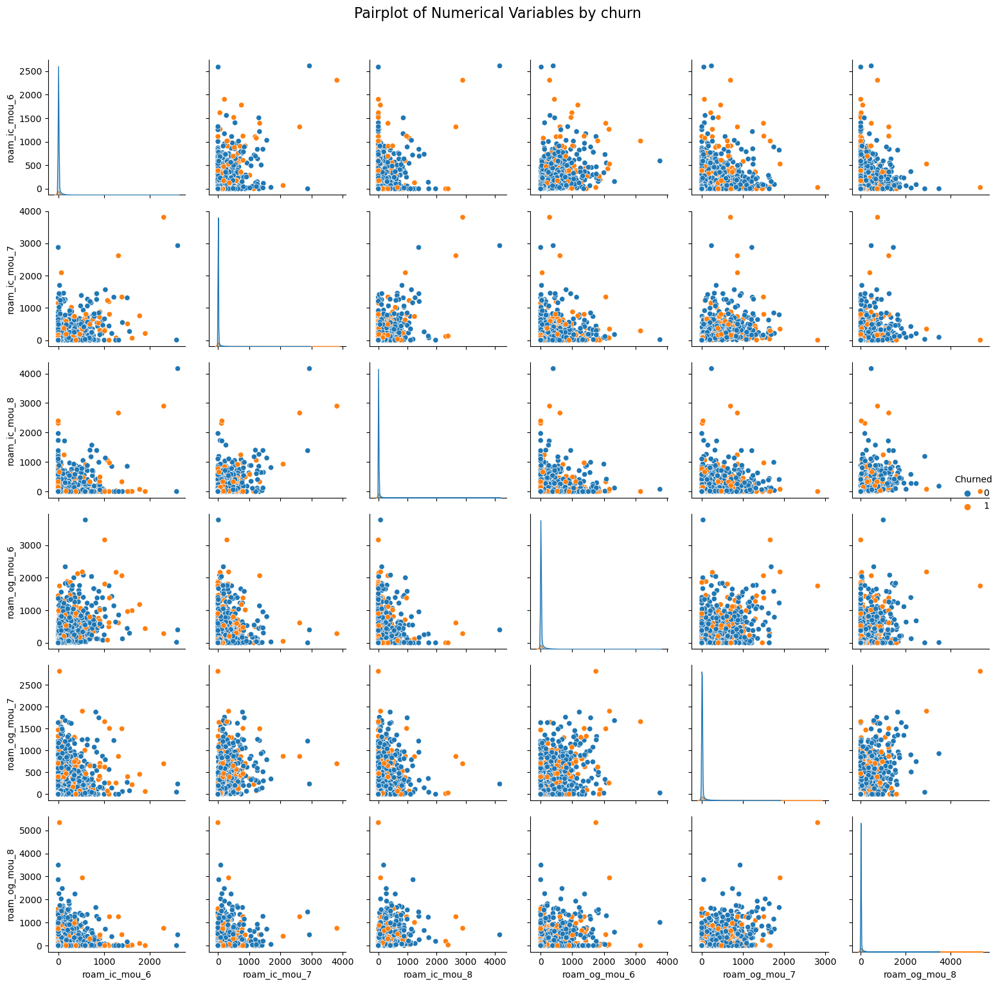

In [75]:
# PAIRPLOT
# Set the figure size and style
plt.figure(figsize=(14, 8))

# Create pairplot with customized appearance
pair_plot = sns.pairplot(data=df_hvc, vars=roam_cols, hue="churn")

# Set titles for the pairplot and legend
pair_plot.fig.suptitle("Pairplot of Numerical Variables by churn", y=1.02, fontsize=16)
pair_plot._legend.set_title("Churned")

# Adjust layout and display the plot
plt.tight_layout()

# Displaying the graph
plt.show()

In [76]:
# Find all columns containing the substring loc_"
loc_cols = [col for col in df_hvc.columns if 'loc' in col]

# Print the list of columns
print(loc_cols)

# Print the length 
print('Count:', len(loc_cols))

['loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'loc_ic_t2t_mou_6', 'loc_ic_t2t_mou_7', 'loc_ic_t2t_mou_8', 'loc_ic_t2m_mou_6', 'loc_ic_t2m_mou_7', 'loc_ic_t2m_mou_8', 'loc_ic_t2f_mou_6', 'loc_ic_t2f_mou_7', 'loc_ic_t2f_mou_8', 'loc_ic_mou_6', 'loc_ic_mou_7', 'loc_ic_mou_8']
Count: 27


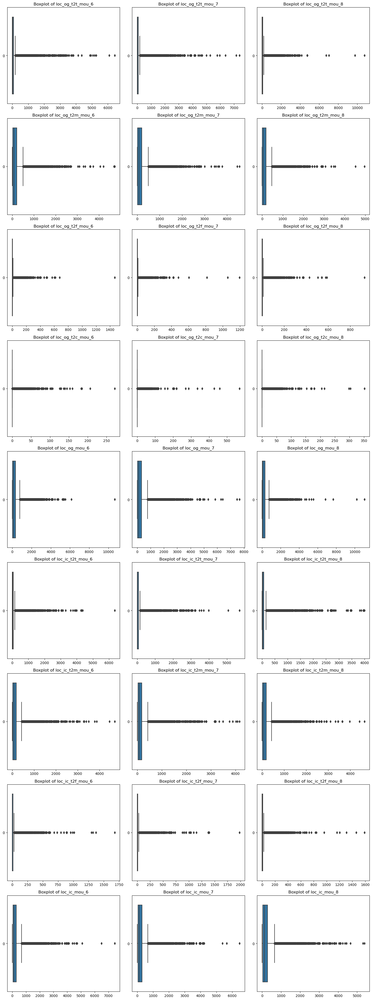

In [77]:
# Calculate the number of rows and columns needed for subplots
num_rows = 9  # Number of rows for subplots
num_cols = 3  # Number of columns for subplots
total_plots = num_rows * num_cols

# Create subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, 40))

# Enumerate features and create boxplots
for i, feature in enumerate(loc_cols):
    row_index = i // num_cols
    col_index = i % num_cols
    sns.boxplot(data=df_hvc[feature], ax=axes[row_index, col_index], orient='horizontal')
    axes[row_index, col_index].set_title(f"Boxplot of {feature}")
    axes[row_index, col_index].set_xlabel('')

# Remove empty subplots
for i in range(len(loc_cols), total_plots):
    row_index = i // num_cols
    col_index = i % num_cols
    fig.delaxes(axes[row_index, col_index])

# Adjust layout to prevent overlap
plt.tight_layout()

# Show plots
plt.show()

In [78]:
# Find all columns containing the substring std_"
std_cols = [col for col in df_hvc.columns if 'std' in col]

# Print the list of columns
print(std_cols)

# Print the length 
print('Count:', len(std_cols))

['std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_t2f_mou_6', 'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8', 'std_ic_t2t_mou_6', 'std_ic_t2t_mou_7', 'std_ic_t2t_mou_8', 'std_ic_t2m_mou_6', 'std_ic_t2m_mou_7', 'std_ic_t2m_mou_8', 'std_ic_t2f_mou_6', 'std_ic_t2f_mou_7', 'std_ic_t2f_mou_8', 'std_ic_mou_6', 'std_ic_mou_7', 'std_ic_mou_8']
Count: 24


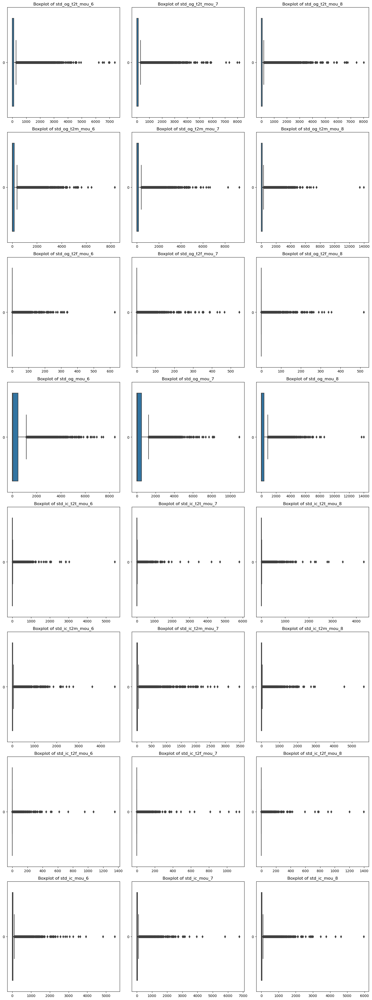

In [79]:

# Calculate the number of rows and columns needed for subplots
num_rows = 8  # Number of rows for subplots
num_cols = 3  # Number of columns for subplots
total_plots = num_rows * num_cols

# Create subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, 40))

# Enumerate features and create boxplots
for i, feature in enumerate(std_cols):
    row_index = i // num_cols
    col_index = i % num_cols
    sns.boxplot(data=df_hvc[feature], ax=axes[row_index, col_index], orient='horizontal')
    axes[row_index, col_index].set_title(f"Boxplot of {feature}")
    axes[row_index, col_index].set_xlabel('')

# Remove empty subplots
for i in range(len(std_cols), total_plots):
    row_index = i // num_cols
    col_index = i % num_cols
    fig.delaxes(axes[row_index, col_index])

# Adjust layout to prevent overlap
plt.tight_layout()

# Show plots
plt.show()

In [80]:
# Find all columns containing the substring "isd_"
isd_cols = [col for col in df_hvc.columns if 'isd' in col]

# Print the list of columns
print(isd_cols)

['isd_og_mou_6', 'isd_og_mou_7', 'isd_og_mou_8', 'isd_ic_mou_6', 'isd_ic_mou_7', 'isd_ic_mou_8']


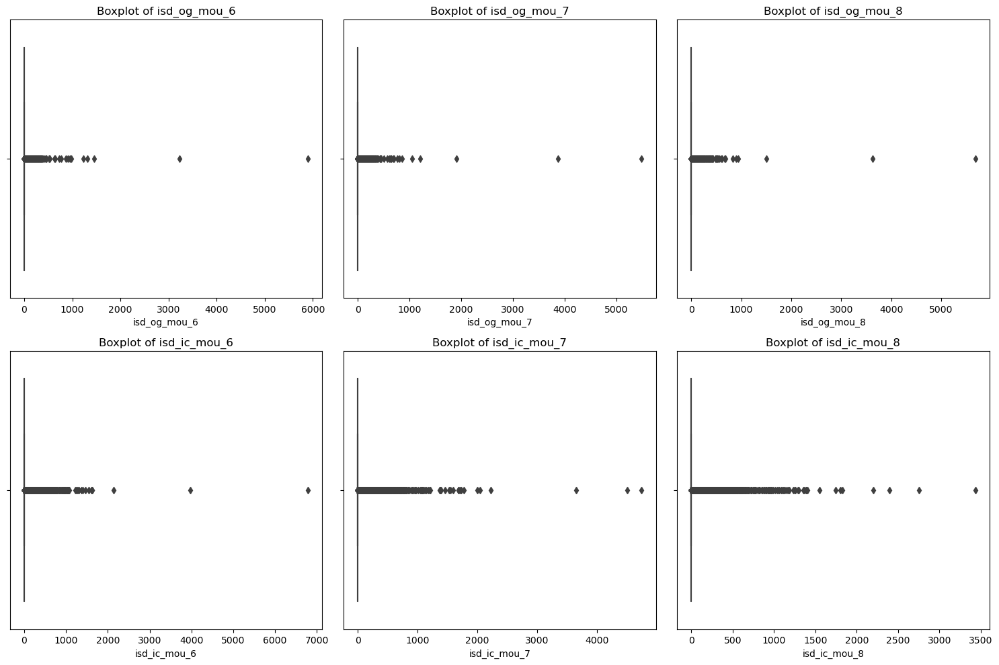

In [81]:
# Create subplots
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))

# Enumerate through the columns and create boxplots
for i, col in enumerate(isd_cols):
    sns.boxplot(x=df_hvc[col], orient='h', ax=axes[i//3, i%3])
    axes[i//3, i%3].set_title(f"Boxplot of {col}")

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plots
plt.show()

<Figure size 1400x800 with 0 Axes>

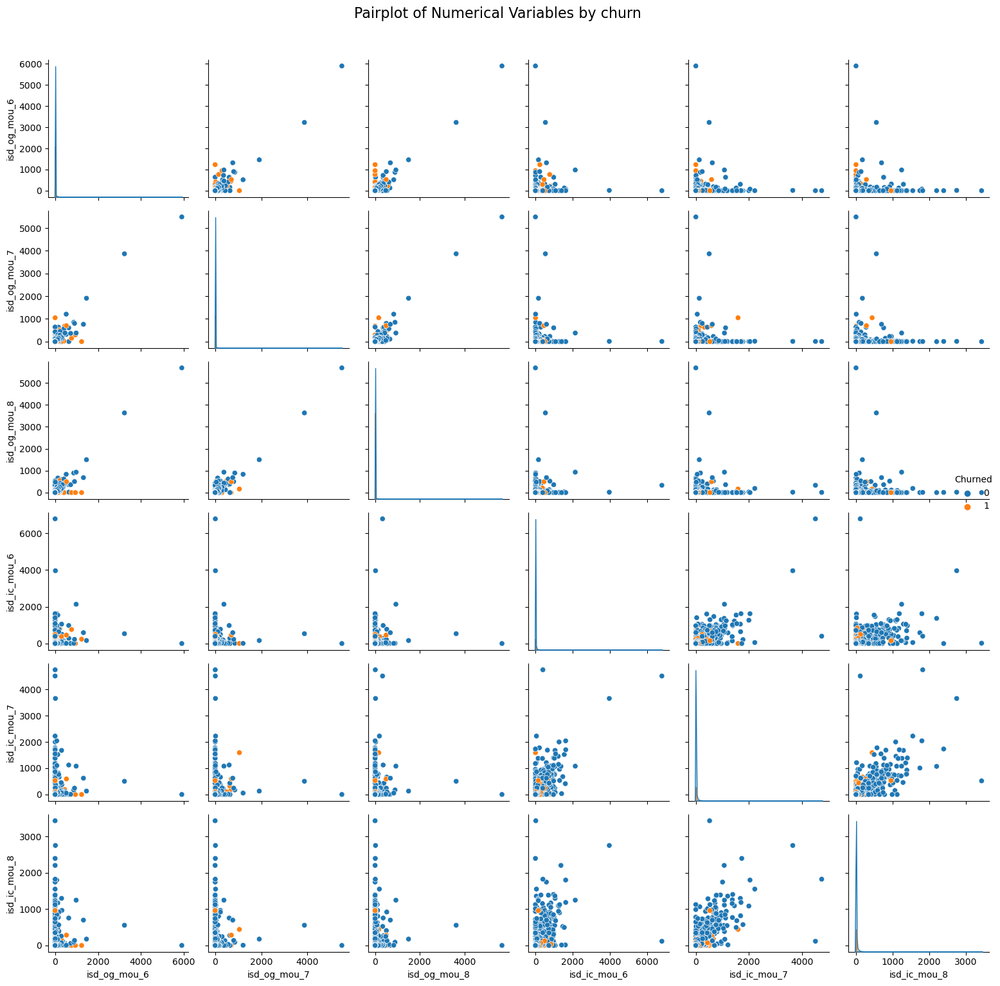

In [82]:
# PAIRPLOT
# Set the figure size and style
plt.figure(figsize=(14, 8))

# Create pairplot with customized appearance
pair_plot = sns.pairplot(data=df_hvc, vars=isd_cols, hue="churn")

# Set titles for the pairplot and legend
pair_plot.fig.suptitle("Pairplot of Numerical Variables by churn", y=1.02, fontsize=16)
pair_plot._legend.set_title("Churned")

# Adjust layout and display the plot
plt.tight_layout()

# Displaying the graph
plt.show()

In [83]:
# Find all columns containing the substring "spl_"
spl_cols = [col for col in df_hvc.columns if 'spl' in col]

# Print the list of columns
print(spl_cols)

['spl_og_mou_6', 'spl_og_mou_7', 'spl_og_mou_8', 'spl_ic_mou_6', 'spl_ic_mou_7', 'spl_ic_mou_8']


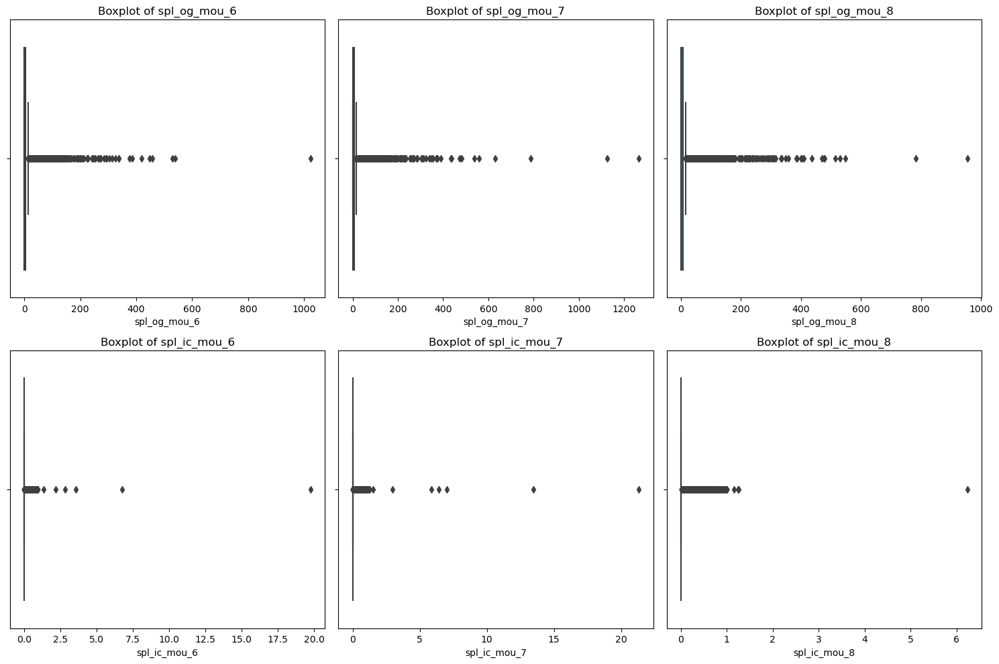

In [84]:
# Create subplots
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))

# Enumerate through the columns and create boxplots
for i, col in enumerate(spl_cols):
    sns.boxplot(x=df_hvc[col], orient='h', ax=axes[i//3, i%3])
    axes[i//3, i%3].set_title(f"Boxplot of {col}")

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plots
plt.show()

<Figure size 1400x800 with 0 Axes>

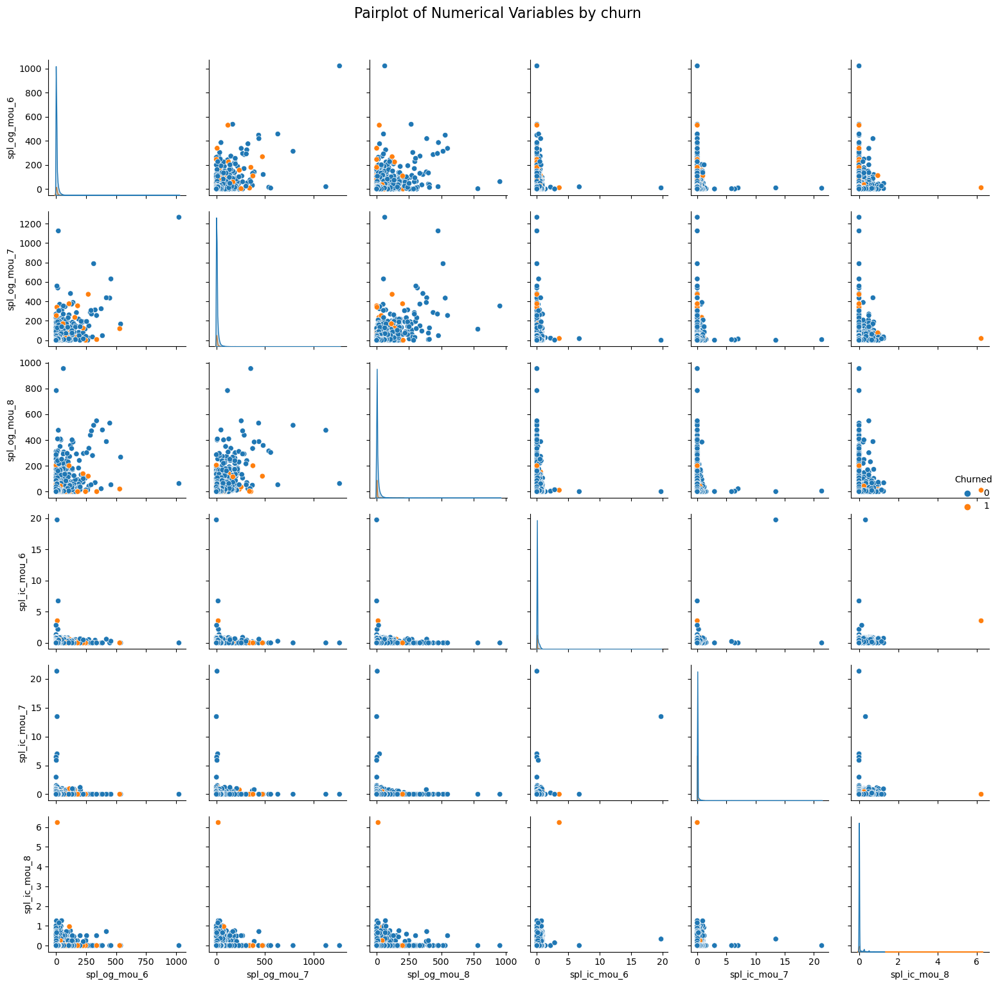

In [85]:
# PAIRPLOT
# Set the figure size and style
plt.figure(figsize=(14, 8))

# Create pairplot with customized appearance
pair_plot = sns.pairplot(data=df_hvc, vars=spl_cols, hue="churn")

# Set titles for the pairplot and legend
pair_plot.fig.suptitle("Pairplot of Numerical Variables by churn", y=1.02, fontsize=16)
pair_plot._legend.set_title("Churned")

# Adjust layout and display the plot
plt.tight_layout()

# Displaying the graph
plt.show()

In [86]:
# Find all columns containing the substring og_"
og_other_cols = [col for col in df_hvc.columns if 'og_other' in col]

# Print the list of columns
print(og_other_cols)

# Print the length 
print('Count:', len(og_other_cols))

['og_others_6', 'og_others_7', 'og_others_8']
Count: 3


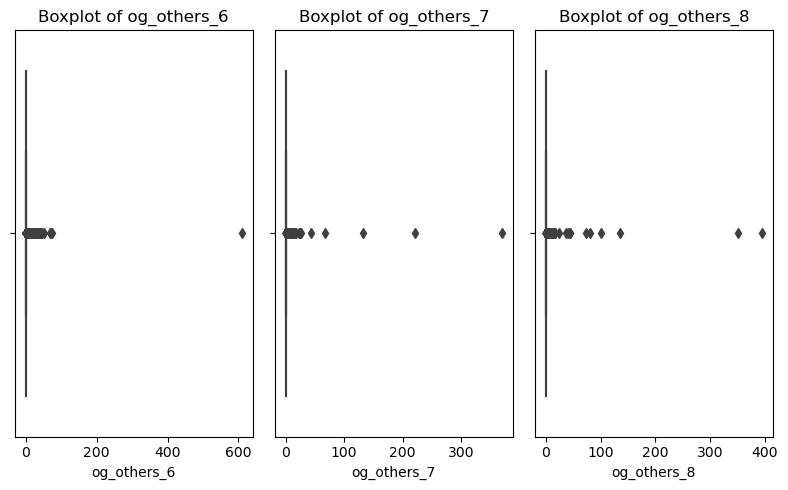

In [87]:
# Create subplots
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(8, 5))

# Enumerate through the columns and create boxplots
for i, col in enumerate(og_other_cols):
    sns.boxplot(x=df_hvc[col], orient='h', ax=axes[i])
    axes[i].set_title(f"Boxplot of {col}")

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plots
plt.show()

<Figure size 1400x800 with 0 Axes>

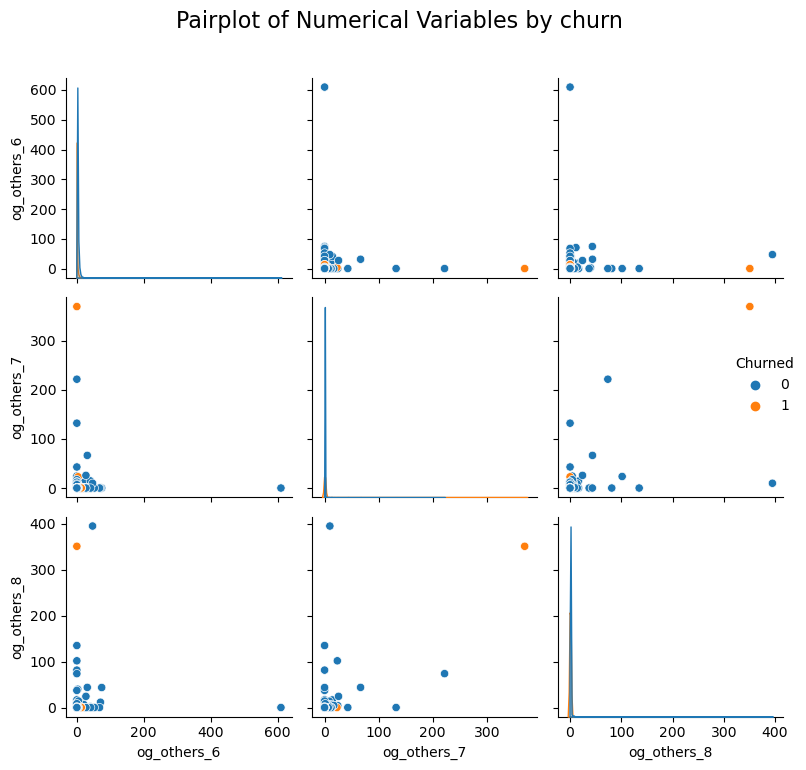

In [88]:
# PAIRPLOT
# Set the figure size and style
plt.figure(figsize=(14, 8))

# Create pairplot with customized appearance
pair_plot = sns.pairplot(data=df_hvc, vars=og_other_cols, hue="churn")

# Set titles for the pairplot and legend
pair_plot.fig.suptitle("Pairplot of Numerical Variables by churn", y=1.02, fontsize=16)
pair_plot._legend.set_title("Churned")

# Adjust layout and display the plot
plt.tight_layout()

# Displaying the graph
plt.show()

In [89]:
# Find all columns containing the substring og_"
total_cols = [col for col in df_hvc.columns if 'total' in col]

# Print the list of columns
print(total_cols)

# Print the length 
print('Count:', len(total_cols))

['total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8', 'total_ic_mou_6', 'total_ic_mou_7', 'total_ic_mou_8', 'total_rech_num_6', 'total_rech_num_7', 'total_rech_num_8', 'total_rech_amt_6', 'total_rech_amt_7', 'total_rech_amt_8', 'total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8', 'total_rech_amt_data_6', 'total_rech_amt_data_7', 'total_rech_amt_data_8', 'total_rech_data_group_8', 'total_rech_num_group_8']
Count: 20


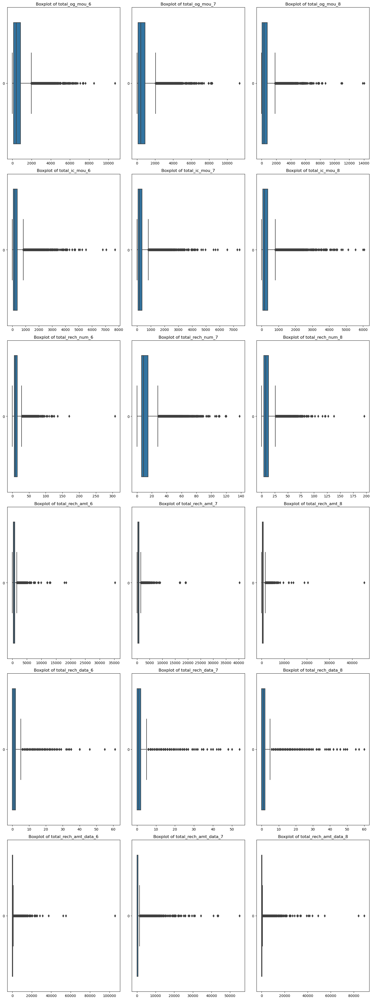

In [90]:
col = ['total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8', 'total_ic_mou_6', 'total_ic_mou_7', 'total_ic_mou_8', 'total_rech_num_6', 'total_rech_num_7', 'total_rech_num_8', 'total_rech_amt_6', 'total_rech_amt_7', 'total_rech_amt_8', 'total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8', 'total_rech_amt_data_6', 'total_rech_amt_data_7', 'total_rech_amt_data_8']
# Calculate the number of rows and columns needed for subplots
num_rows = 6  # Number of rows for subplots
num_cols = 3  # Number of columns for subplots
total_plots = num_rows * num_cols

# Create subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, 40))

# Enumerate features and create boxplots
for i, feature in enumerate(col):
    row_index = i // num_cols
    col_index = i % num_cols
    sns.boxplot(data=df_hvc[feature], ax=axes[row_index, col_index], orient='horizontal')
    axes[row_index, col_index].set_title(f"Boxplot of {feature}")
    axes[row_index, col_index].set_xlabel('')

# Remove empty subplots
for i in range(len(col), total_plots):
    row_index = i // num_cols
    col_index = i % num_cols
    fig.delaxes(axes[row_index, col_index])

# Adjust layout to prevent overlap
plt.tight_layout()

# Show plots
plt.show()

In [91]:
# Find all columns containing the substring "ic_others_"
ic_others_cols = [col for col in df_hvc.columns if 'ic_others' in col]

# Print the list of columns
print(ic_others_cols)

['ic_others_6', 'ic_others_7', 'ic_others_8']


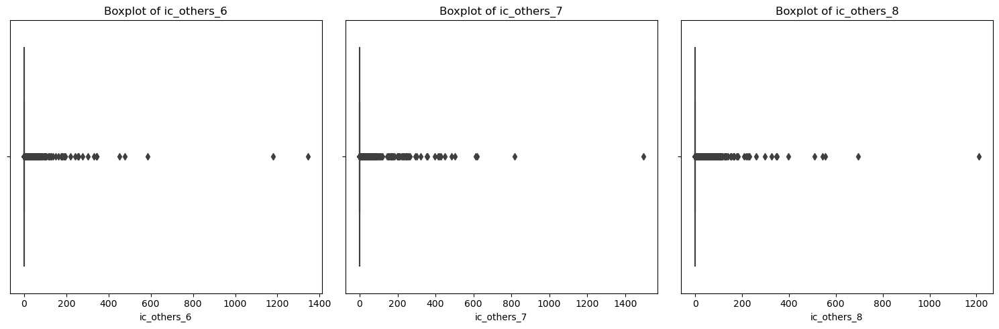

In [92]:
# Create subplots
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5))

# Enumerate through the columns and create boxplots
for i, col in enumerate(ic_others_cols):
    sns.boxplot(x=df_hvc[col], orient='h', ax=axes[i])
    axes[i].set_title(f"Boxplot of {col}")

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plots
plt.show()

<Figure size 1400x800 with 0 Axes>

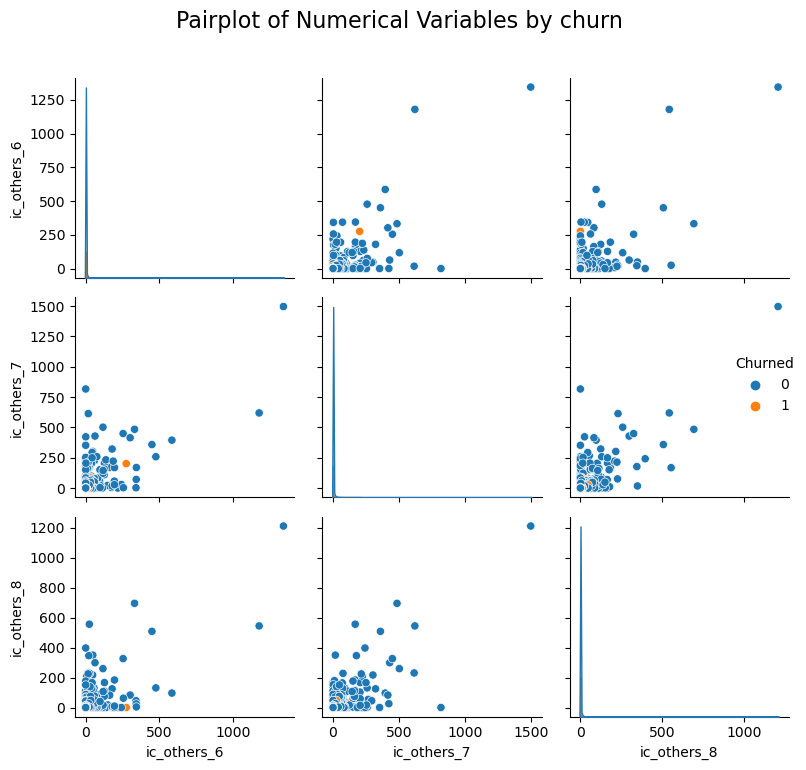

In [93]:
# PAIRPLOT
# Set the figure size and style
plt.figure(figsize=(14, 8))

# Create pairplot with customized appearance
pair_plot = sns.pairplot(data=df_hvc, vars=ic_others_cols, hue="churn")

# Set titles for the pairplot and legend
pair_plot.fig.suptitle("Pairplot of Numerical Variables by churn", y=1.02, fontsize=16)
pair_plot._legend.set_title("Churned")

# Adjust layout and display the plot
plt.tight_layout()

# Displaying the graph
plt.show()

In [94]:
# Find all columns containing the substring "max_"
max_cols = [col for col in df_hvc.columns if 'max' in col]

# Print the list of columns
print(max_cols)

['max_rech_amt_6', 'max_rech_amt_7', 'max_rech_amt_8']


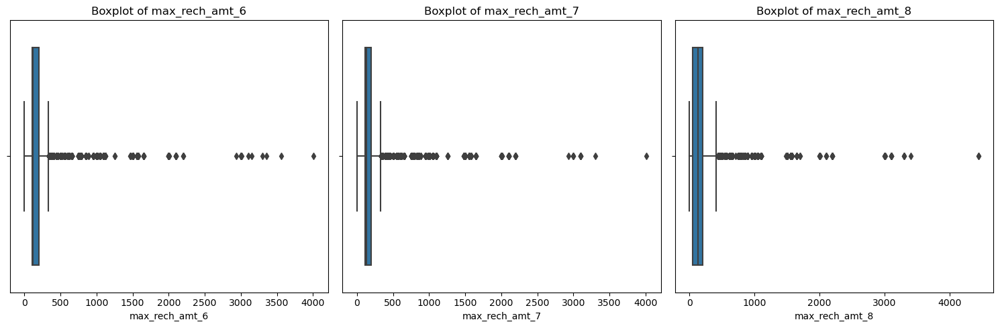

In [95]:
# Create subplots
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5))

# Enumerate through the columns and create boxplots
for i, col in enumerate(max_cols):
    sns.boxplot(x=df_hvc[col], orient='h', ax=axes[i])
    axes[i].set_title(f"Boxplot of {col}")

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plots
plt.show()

<Figure size 1400x800 with 0 Axes>

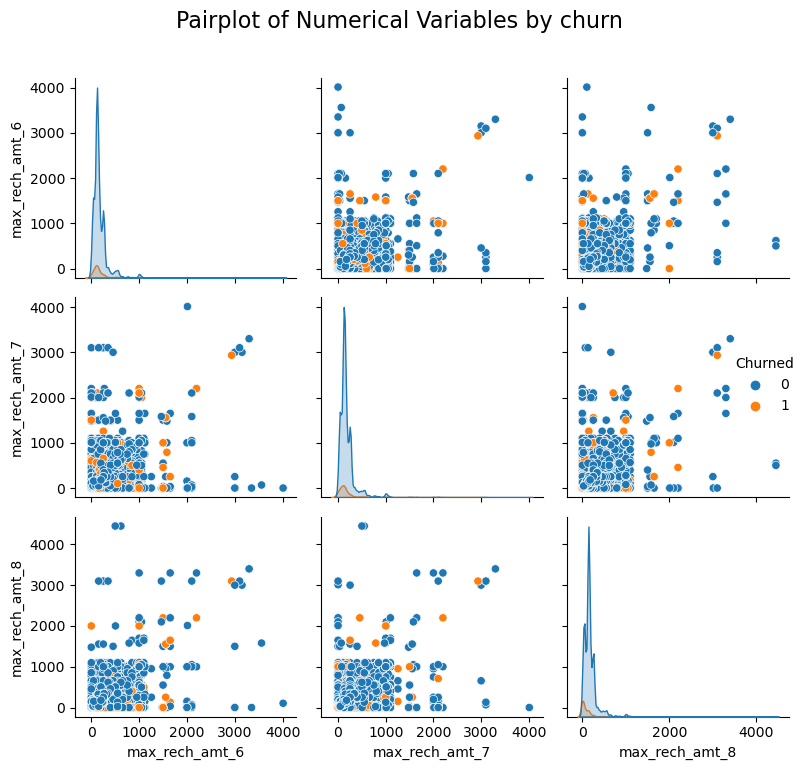

In [96]:
# PAIRPLOT
# Set the figure size and style
plt.figure(figsize=(14, 8))

# Create pairplot with customized appearance
pair_plot = sns.pairplot(data=df_hvc, vars=max_cols, hue="churn")

# Set titles for the pairplot and legend
pair_plot.fig.suptitle("Pairplot of Numerical Variables by churn", y=1.02, fontsize=16)
pair_plot._legend.set_title("Churned")

# Adjust layout and display the plot
plt.tight_layout()

# Displaying the graph
plt.show()

In [97]:
# Find all columns containing the substring "last_day"
last_day_cols = [col for col in df_hvc.columns if 'last_day' in col]

# Print the list of columns
print(last_day_cols)

['last_day_rch_amt_6', 'last_day_rch_amt_7', 'last_day_rch_amt_8']


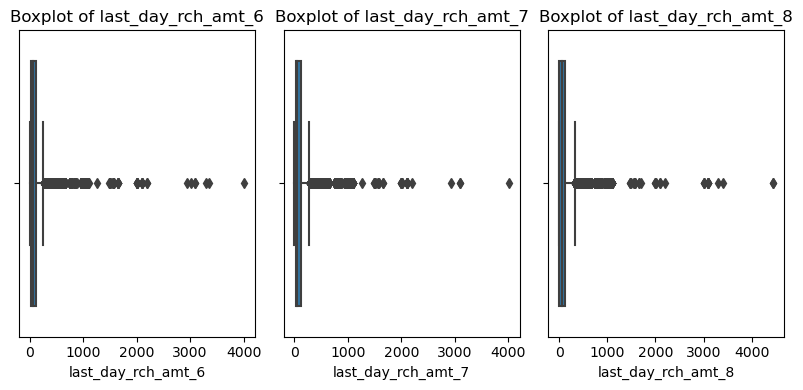

In [98]:
# Create subplots
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(8, 4))

# Enumerate through the columns and create boxplots
for i, col in enumerate(last_day_cols):
    sns.boxplot(x=df_hvc[col], orient='h', ax=axes[i])
    axes[i].set_title(f"Boxplot of {col}")

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plots
plt.show()

<Figure size 1400x800 with 0 Axes>

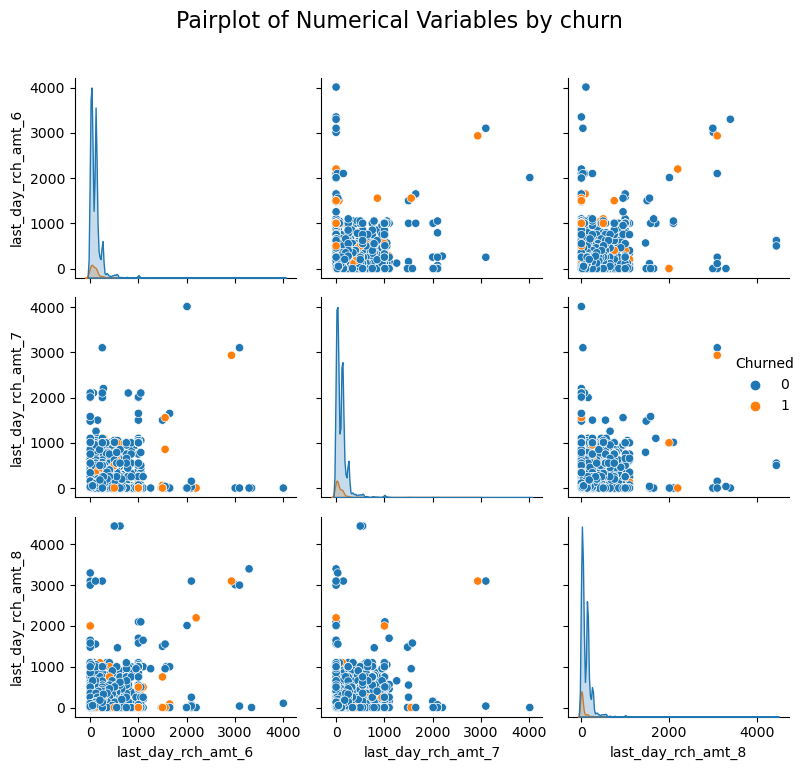

In [99]:
# PAIRPLOT
# Set the figure size and style
plt.figure(figsize=(14, 8))

# Create pairplot with customized appearance
pair_plot = sns.pairplot(data=df_hvc, vars=last_day_cols, hue="churn")

# Set titles for the pairplot and legend
pair_plot.fig.suptitle("Pairplot of Numerical Variables by churn", y=1.02, fontsize=16)
pair_plot._legend.set_title("Churned")

# Adjust layout and display the plot
plt.tight_layout()

# Displaying the graph
plt.show()

In [100]:
# Find all columns containing the substring "av_rech"
av_rech_cols = [col for col in df_hvc.columns if 'av_rech' in col]

# Print the list of columns
print(av_rech_cols)

['av_rech_amt_data_6', 'av_rech_amt_data_7', 'av_rech_amt_data_8']


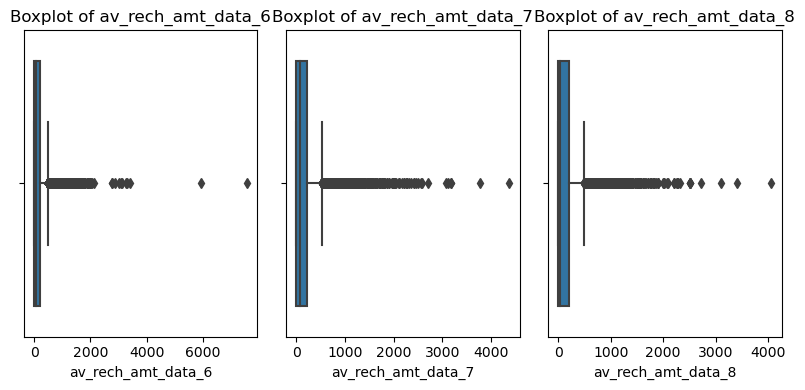

In [101]:
# Create subplots
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(8, 4))

# Enumerate through the columns and create boxplots
for i, col in enumerate(av_rech_cols):
    sns.boxplot(x=df_hvc[col], orient='h', ax=axes[i])
    axes[i].set_title(f"Boxplot of {col}")

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plots
plt.show()

<Figure size 1400x800 with 0 Axes>

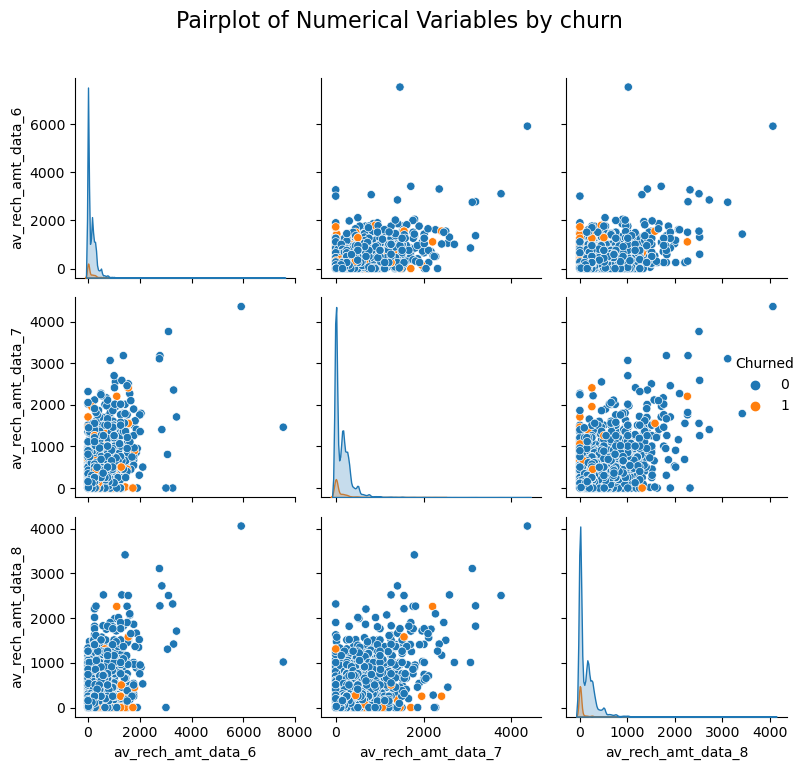

In [102]:
# PAIRPLOT
# Set the figure size and style
plt.figure(figsize=(14, 8))

# Create pairplot with customized appearance
pair_plot = sns.pairplot(data=df_hvc, vars=av_rech_cols, hue="churn")

# Set titles for the pairplot and legend
pair_plot.fig.suptitle("Pairplot of Numerical Variables by churn", y=1.02, fontsize=16)
pair_plot._legend.set_title("Churned")

# Adjust layout and display the plot
plt.tight_layout()

# Displaying the graph
plt.show()

In [103]:
# Find all columns containing the substring "vol_"
vol_cols = [col for col in df_hvc.columns if 'vol' in col]

# Print the list of columns
print(vol_cols)

['vol_2g_mb_6', 'vol_2g_mb_7', 'vol_2g_mb_8', 'vol_3g_mb_6', 'vol_3g_mb_7', 'vol_3g_mb_8']


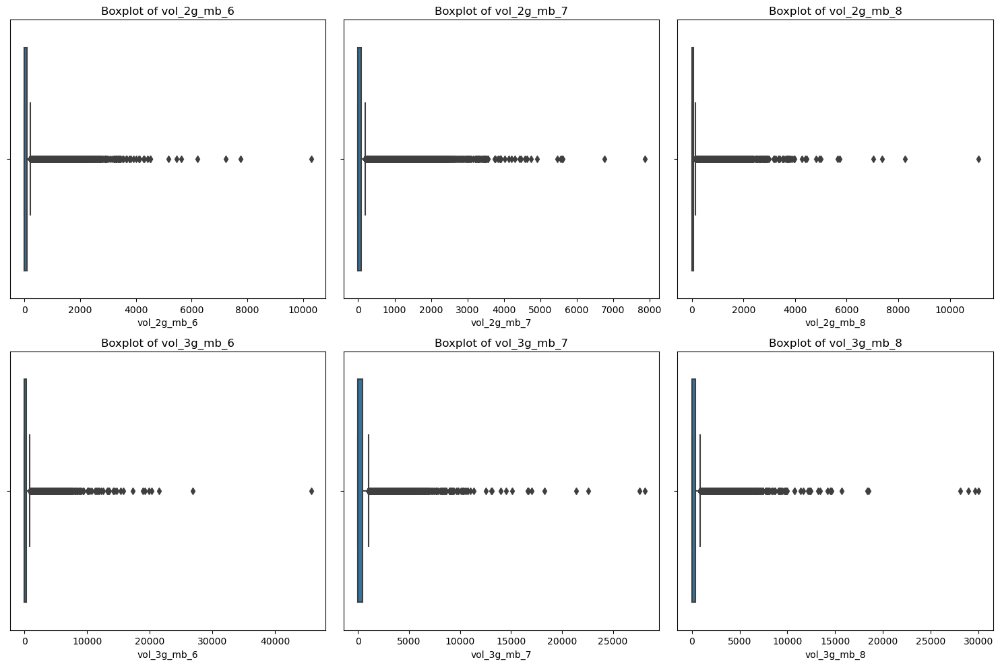

In [104]:
# Create subplots
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))

# Enumerate through the columns and create boxplots
for i, col in enumerate(vol_cols):
    sns.boxplot(x=df_hvc[col], orient='h', ax=axes[i//3, i%3])
    axes[i//3, i%3].set_title(f"Boxplot of {col}")

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plots
plt.show()

<Figure size 1400x800 with 0 Axes>

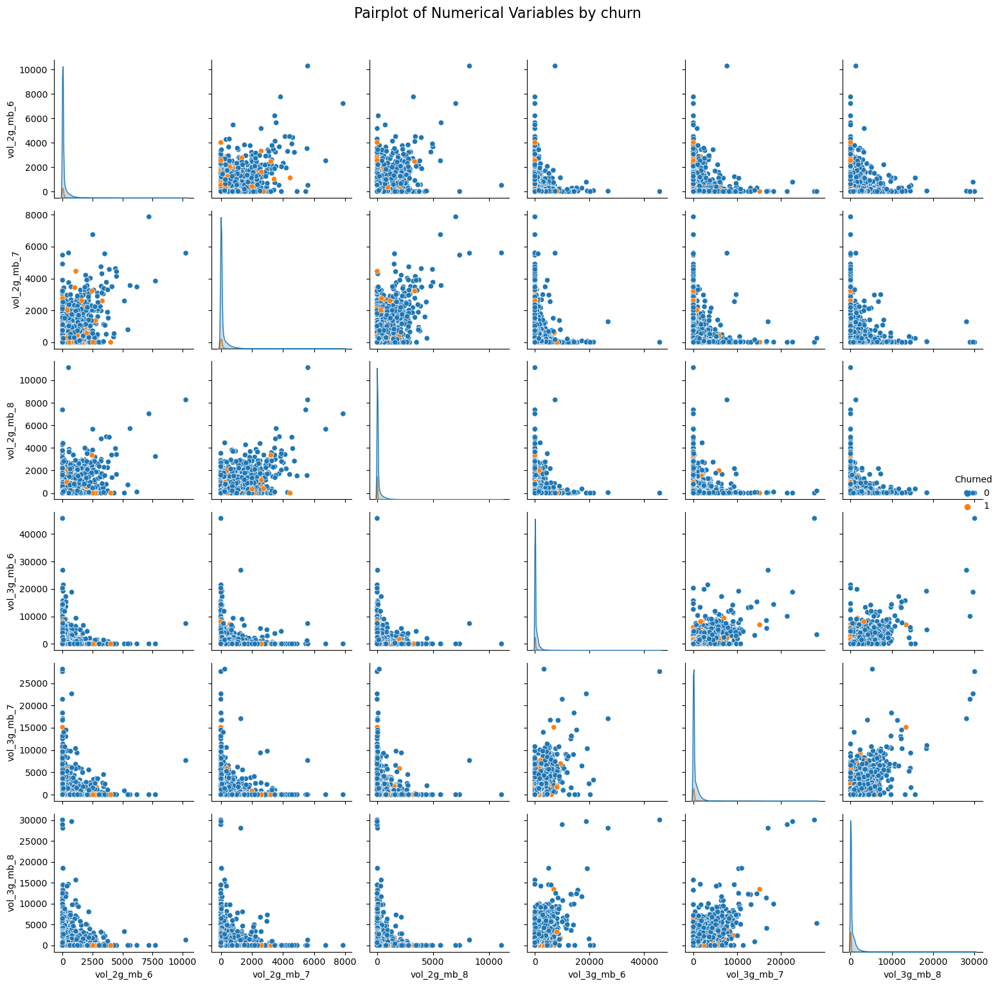

In [105]:
# PAIRPLOT
# Set the figure size and style
plt.figure(figsize=(14, 8))

# Create pairplot with customized appearance
pair_plot = sns.pairplot(data=df_hvc, vars=vol_cols, hue="churn")

# Set titles for the pairplot and legend
pair_plot.fig.suptitle("Pairplot of Numerical Variables by churn", y=1.02, fontsize=16)
pair_plot._legend.set_title("Churned")

# Adjust layout and display the plot
plt.tight_layout()

# Displaying the graph
plt.show()

In [106]:
# Find all columns containing the substring "monthly_"
monthly_cols = [col for col in df_hvc.columns if 'monthly' in col]

# Print the list of columns
print(monthly_cols)

['monthly_2g_6', 'monthly_2g_7', 'monthly_2g_8', 'monthly_3g_6', 'monthly_3g_7', 'monthly_3g_8']


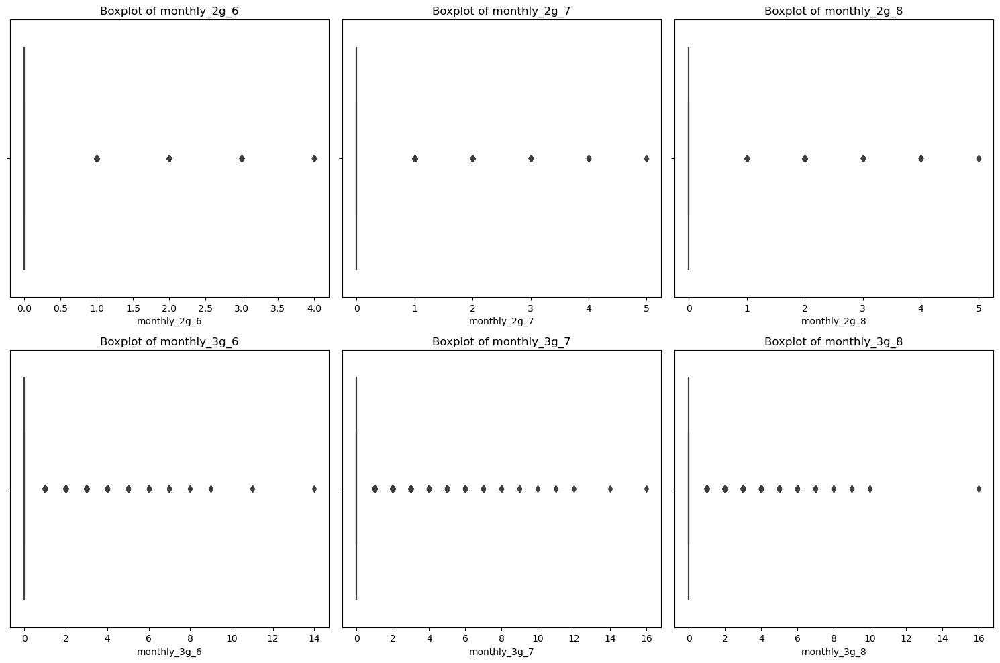

In [107]:
# Create subplots
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))

# Enumerate through the columns and create boxplots
for i, col in enumerate(monthly_cols):
    sns.boxplot(x=df_hvc[col], orient='h', ax=axes[i//3, i%3])
    axes[i//3, i%3].set_title(f"Boxplot of {col}")

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plots
plt.show()

<Figure size 1400x800 with 0 Axes>

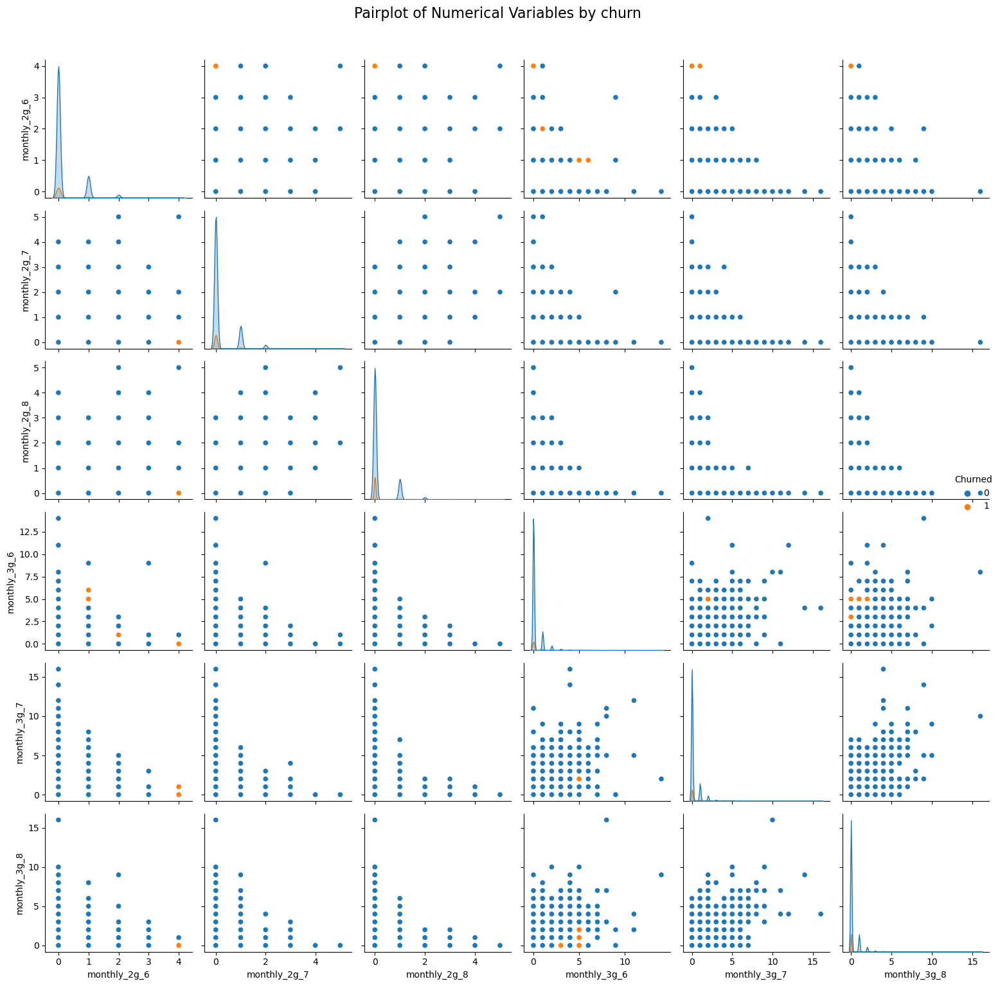

In [108]:
# PAIRPLOT
# Set the figure size and style
plt.figure(figsize=(14, 8))

# Create pairplot with customized appearance
pair_plot = sns.pairplot(data=df_hvc, vars=monthly_cols, hue="churn")

# Set titles for the pairplot and legend
pair_plot.fig.suptitle("Pairplot of Numerical Variables by churn", y=1.02, fontsize=16)
pair_plot._legend.set_title("Churned")

# Adjust layout and display the plot
plt.tight_layout()

# Displaying the graph
plt.show()

In [109]:
# Find all columns containing the substring "sachet_"
sachet_cols = [col for col in df_hvc.columns if 'sachet' in col]

# Print the list of columns
print(sachet_cols)

['sachet_2g_6', 'sachet_2g_7', 'sachet_2g_8', 'sachet_3g_6', 'sachet_3g_7', 'sachet_3g_8']


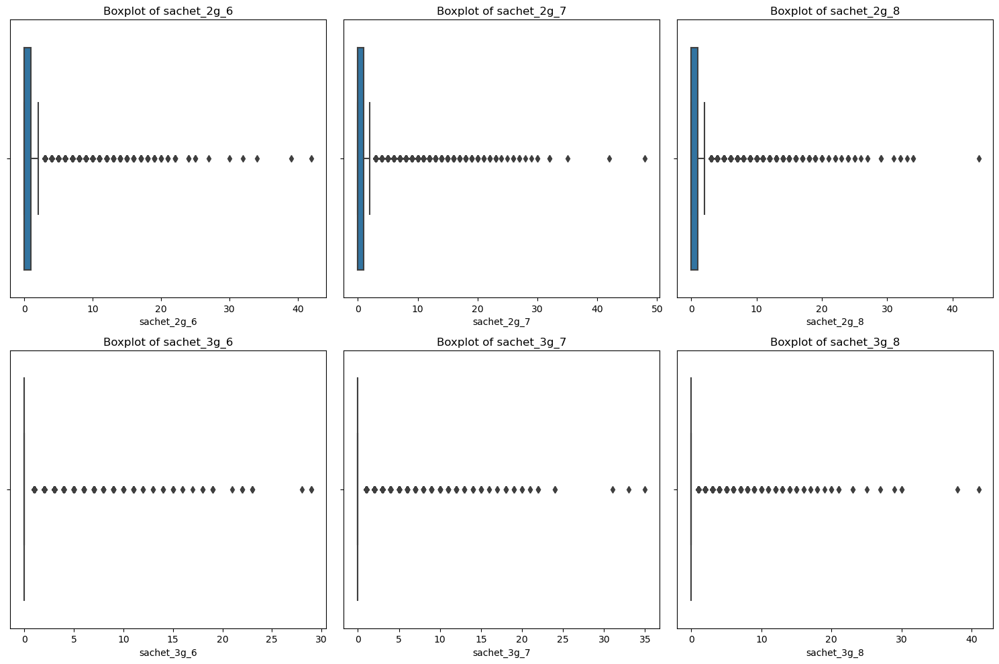

In [110]:
# Create subplots
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))

# Enumerate through the columns and create boxplots
for i, col in enumerate(sachet_cols):
    sns.boxplot(x=df_hvc[col], orient='h', ax=axes[i//3, i%3])
    axes[i//3, i%3].set_title(f"Boxplot of {col}")

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plots
plt.show()

<Figure size 1400x800 with 0 Axes>

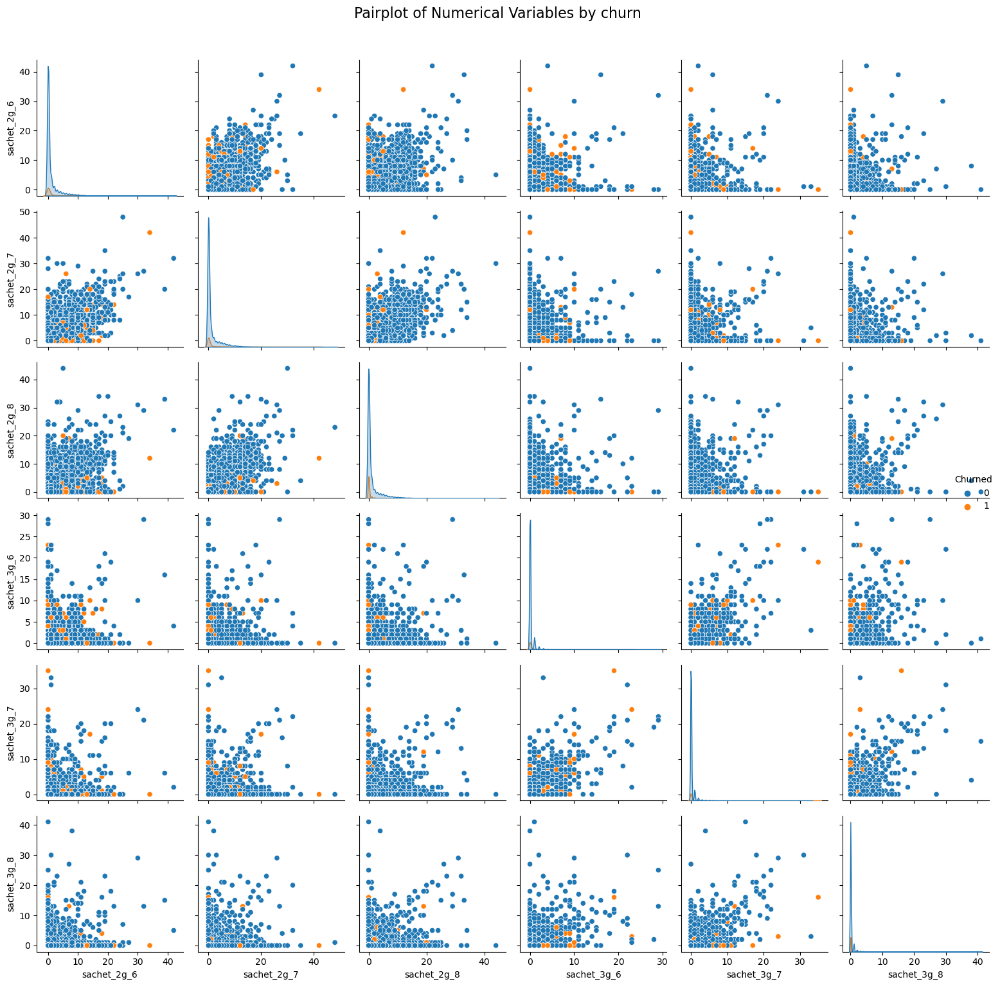

In [111]:
# PAIRPLOT
# Set the figure size and style
plt.figure(figsize=(14, 8))

# Create pairplot with customized appearance
pair_plot = sns.pairplot(data=df_hvc, vars=sachet_cols, hue="churn")

# Set titles for the pairplot and legend
pair_plot.fig.suptitle("Pairplot of Numerical Variables by churn", y=1.02, fontsize=16)
pair_plot._legend.set_title("Churned")

# Adjust layout and display the plot
plt.tight_layout()

# Displaying the graph
plt.show()

In [112]:
# Columns list
cols = ['aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g', 'sep_vbc_3g']

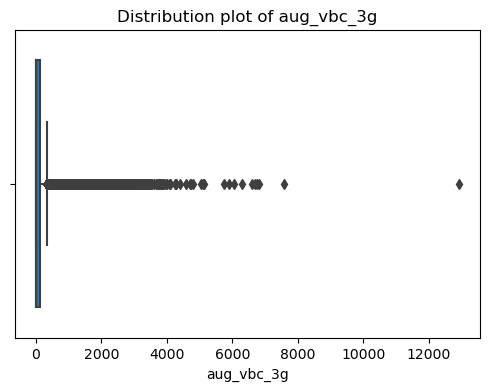

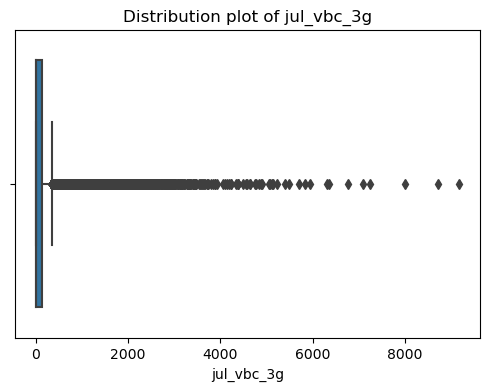

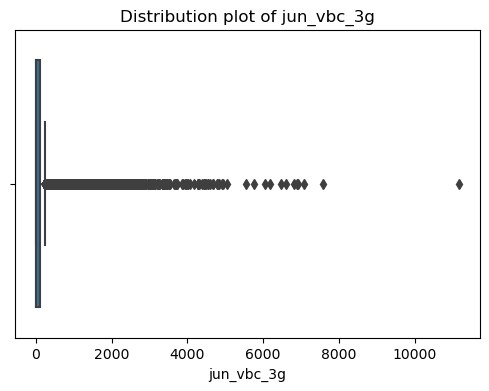

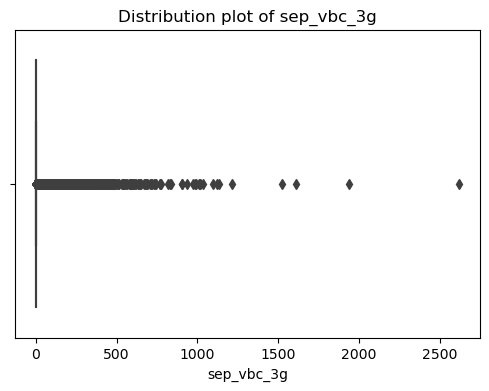

In [113]:
# Iterate through all numerical columns
for i in cols[:5]:
    
    # Create a new figure
    plt.figure(figsize=[6,4])
    
    # Set title of the plot
    plt.title("Distribution plot of {}".format(i))
    
    # Create distribution plot
    sns.boxplot(x=df_hvc[i], orient='h')
    
    # Rotate x-axis labels
    plt.xticks(rotation=0)
    
    # Displaying the graph
    plt.show()

<Figure size 1400x800 with 0 Axes>

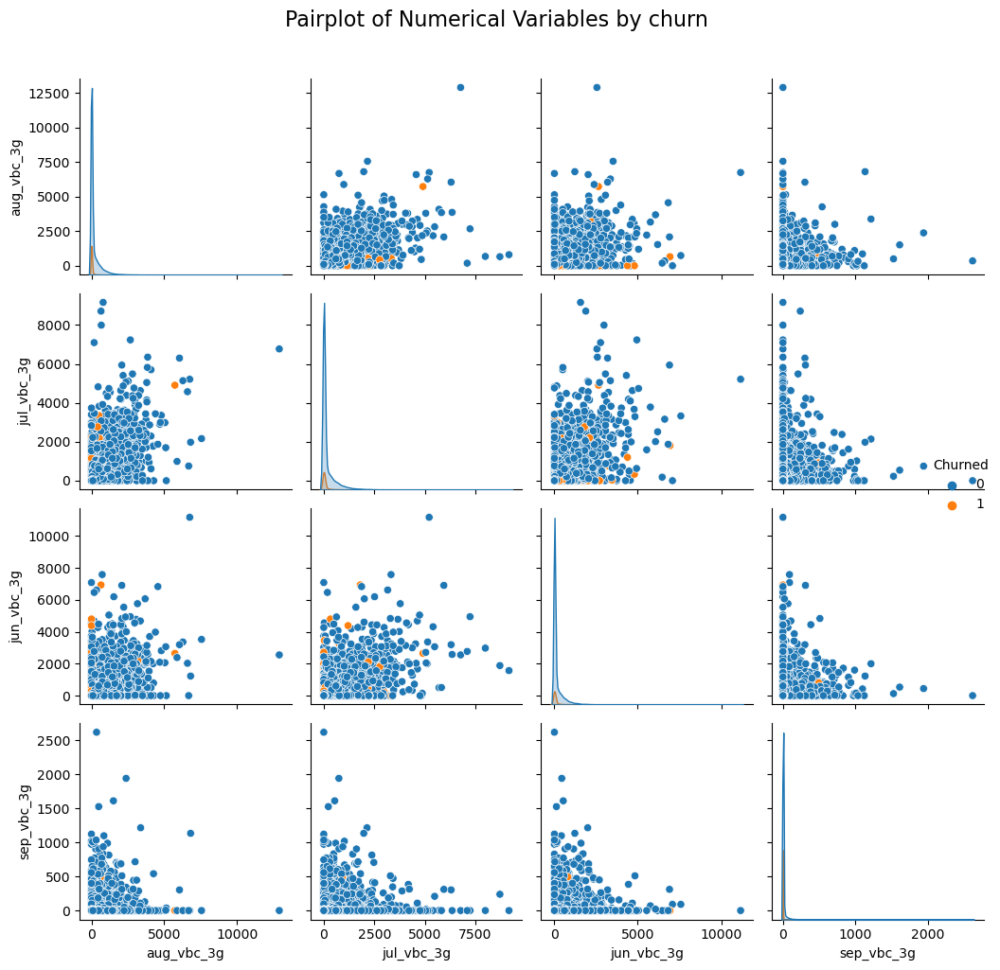

In [114]:
# PAIRPLOT
# Set the figure size and style
plt.figure(figsize=(14, 8))

# Create pairplot with customized appearance
pair_plot = sns.pairplot(data=df_hvc, vars=cols, hue="churn")

# Set titles for the pairplot and legend
pair_plot.fig.suptitle("Pairplot of Numerical Variables by churn", y=1.02, fontsize=16)
pair_plot._legend.set_title("Churned")

# Adjust layout and display the plot
plt.tight_layout()

# Displaying the graph
plt.show()

## CORRELATION MATRIX

In [115]:
# Selecting numerical columns
numerical_cols = df_hvc.select_dtypes(include=['int', 'float']).columns

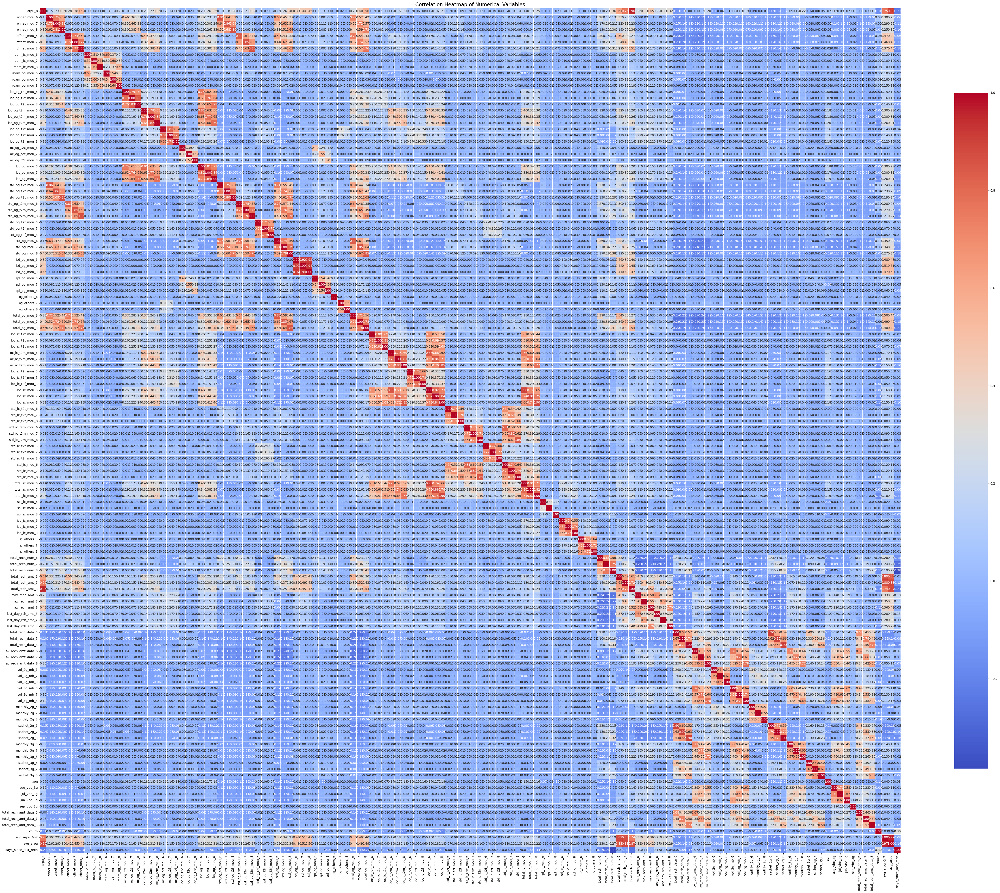

In [116]:
# Set the figure size
plt.figure(figsize=(50, 40))

# Create heatmap with customized appearance
heatmap = sns.heatmap(data=df_hvc[numerical_cols].corr(), cmap="coolwarm", annot=True, fmt=".2f", linewidths=0.5, cbar_kws={"shrink": 0.8})

# Set title for the heatmap
plt.title("Correlation Heatmap of Numerical Variables", fontsize=16)

# Adjust layout and display the plot
plt.tight_layout()

# Displaying the graph
plt.show()

In [117]:
# Calculating correlation matrix
corr_matrix = df_hvc[numerical_cols].corr()

# Calculating correlation matrix
corr_matrix = df_hvc[numerical_cols].corr()

# Finding pairs with correlation greater than 0.85
high_corr_pairs = []
for i in range(len(corr_matrix.columns)):
    for j in range(i+1, len(corr_matrix.columns)):
        if abs(corr_matrix.iloc[i, j]) > 0.85:
            high_corr_pairs.append((corr_matrix.columns[i], corr_matrix.columns[j], corr_matrix.iloc[i, j]))

# Sorting high correlation pairs in descending order
high_corr_pairs_sorted = sorted(high_corr_pairs, key=lambda x: abs(x[2]), reverse=True)

# Printing high correlation pairs sorted in descending order
for pair in high_corr_pairs_sorted:
    print("Correlation between {} and {}: {:.2f}".format(pair[0], pair[1], pair[2]))

Correlation between avg_arpu_6n7 and avg_arpu: 0.97
Correlation between arpu_8 and total_rech_amt_8: 0.96
Correlation between isd_og_mou_7 and isd_og_mou_8: 0.94
Correlation between isd_og_mou_6 and isd_og_mou_8: 0.92
Correlation between isd_og_mou_6 and isd_og_mou_7: 0.92
Correlation between total_rech_data_7 and sachet_2g_7: 0.90
Correlation between total_rech_data_6 and sachet_2g_6: 0.90
Correlation between total_rech_data_8 and sachet_2g_8: 0.90
Correlation between arpu_8 and avg_arpu: 0.90
Correlation between loc_ic_mou_6 and total_ic_mou_6: 0.90
Correlation between loc_ic_mou_8 and total_ic_mou_8: 0.90
Correlation between total_rech_amt_6 and avg_arpu_6n7: 0.89
Correlation between loc_ic_mou_7 and total_ic_mou_7: 0.88
Correlation between total_rech_amt_7 and avg_arpu: 0.88
Correlation between total_rech_amt_7 and avg_arpu_6n7: 0.88
Correlation between total_rech_amt_8 and avg_arpu: 0.87
Correlation between onnet_mou_8 and std_og_t2t_mou_8: 0.86
Correlation between onnet_mou_7 and

## ANALYSIS BASED ON EDA
- The analysis reveals that a significant portion of churn happens within the first 6-12 month period after customers subscribe to the service. This indicates that customers are more likely to churn during the initial phase.
- Customers who maintain a consistently high monthly amount over a longer period are less likely to churn compared to those who have sporadic high monthly amounts over a short period of time. This suggests that long-term, high-value customers are more loyal to the service.
- There is a trend indicating that customers are less likely to churn as they continue to use the service for a longer duration. This suggests that customer loyalty increases with tenure, and churn rates decrease over time.
- The total recharge amount tends to increase with the number of recharges.
- The Average Revenue Per User (ARPU) for churned customers is mostly concentrated in the range of 0 to 900, while for non-churned customers, it is primarily concentrated in the range of 0 to 1000. This suggests that higher ARPU customers are less likely to churn, indicating a correlation between revenue and customer retention.
- The analysis indicates that most customers have a data consumption below 1000 MB, highlighting the importance of offering data plans that cater to varying usage needs.
- There is a strong positive correlation observed between average revenue per user and total recharge amount, total recharge data, and sachet usage. This implies that customers who spend more on recharges tend to generate higher revenue for the telecom company.

# DATA MODEL

#### DUMMY VRAIBALES

Categorical varibles with multiple levels will need to create dummy features.

In [118]:
# Creating dummy variables for all the categorical variables
df_hvc = pd.get_dummies(df_hvc, drop_first=True, dtype=int)

In [119]:
# Checking the dataframe
df_hvc.head()

,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_rech_amt_data_6,total_rech_amt_data_7,total_rech_amt_data_8,churn,avg_arpu_6n7,avg_arpu,days_since_last_rech,aon_range_6-12 Months,aon_range_1-2 Yrs,aon_range_2-5 Yrs,aon_range_5+ Yrs,total_rech_data_group_8_Less than 10 Recharges,total_rech_data_group_8_10-25 Recharges,total_rech_data_group_8_More than 25 Recharges,total_rech_num_group_8_Less than 10 Recharges,total_rech_num_group_8_10-25 Recharges,total_rech_num_group_8_More than 25 Recharges
0,213.803,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.16,0.00,0.00,4.13,0.00,0.00,1.15,0.00,0.00,5.44,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5.44,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,4,3,2,362,252,252,252,252,252,252,252,252,1.0,1.0,1.0,252.0,252.0,252.0,30.13,1.32,5.75,83.57,150.76,109.61,0,0,0,0,0,0,1,1,1,0,0,0,968,30.40,0.00,101.20,3.58,252.0,252.0,252.0,1,206.10,208.67,53,0,0,1,0,1,0,0,1,0,0
7,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,60.86,75.14,77.84,0.0,0.18,10.01,4.5,0.0,6.50,0.0,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,3638,1580,790,1580,0,0,779,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,0.00,0.0,0.0,0.0,1,1209.51,1863.50,35,0,0,1,0,0,0,0,1,0,0
8,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,130.26,143.48,98.28,0.0,0.00,0.00,0.0,0.0,10.23,0.0,0

## Data preparation

#### Train Test Split

In [120]:
# Separating features (X) and target variable (y)
X = df_hvc.drop(['churn'], axis=1)  # Features
y = df_hvc['churn']  # Target variable

# Splitting the data into train and test sets with a 70:30 ratio
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=42, stratify=y)

#### Scaling 

In [121]:
from sklearn.preprocessing import RobustScaler

# Creating a RobustScaler object with a custom quantile range
scaler = RobustScaler(quantile_range=(2, 98))

In [122]:
# Checking the data
X_train.head()

,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_rech_amt_data_6,total_rech_amt_data_7,total_rech_amt_data_8,avg_arpu_6n7,avg_arpu,days_since_last_rech,aon_range_6-12 Months,aon_range_1-2 Yrs,aon_range_2-5 Yrs,aon_range_5+ Yrs,total_rech_data_group_8_Less than 10 Recharges,total_rech_data_group_8_10-25 Recharges,total_rech_data_group_8_More than 25 Recharges,total_rech_num_group_8_Less than 10 Recharges,total_rech_num_group_8_10-25 Recharges,total_rech_num_group_8_More than 25 Recharges
85078,550.074,406.73,742.63,541.44,102.78,215.29,146.16,0.0,0.00,0.00,18.16,0.00,0.00,22.16,80.78,44.44,76.44,92.16,106.21,0.00,0.0,0.00,8.53,0.00,0.00,98.61,172.94,150.66,368.11,661.84,496.99,13.04,123.13,39.84,0.0,0.00,0.00,381.16,784.98,536.84,0.0,0.0,0.0,17.66,18.44,38.36,7.58,0.0,0.0,505.03,976.38,725.88,17.41,38.61,66.11,120.79,130.19,152.38,0.00,0.00,0.00,138.21,168.81,218.49,121.38,78.41,141.11,6.78,45.19,0.0,0.00,0.00,0.0,128.16,123.61,141.11,266.38,292.43,359.61,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,23,17,27,636,798,648,110,110,130,110,110,10,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,1047,0.00,0.00,0.00,0.0,0.0,0.0,0.0,614.00,592.69,30,0,0,1,0,0,0,0,0,0,1
86943,701.240,239.41,199.96,162.59,141.68,104.49,120.89,0.0,0.00,0.00,0.00,0.00,0.00,239.41,199.96,162.59,135.96,92.28,101.11,4.99,2.2,1.33,0.00,0.00,0.00,380.38,294.44,265.04,0.00,0.00,0.00,0.71,0.00,0.00,0.0,10.01,14.61,0.71,10.01,14.61,0.0,0.0,0.0,0.55,5.36,5.53,1.81,0.0,0.0,383.46,309.83,285.19,205.43,258.08,262.14,276.21,226.29,234.34,4.64,11.78,7.23,486.29,496.16,503.73,0.00,1.74,0.00,0.30,0.00,0.0,1.81,4.45,0.0,2.11,6.19,0.00,488.41,502.36,503.76,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.03,9,8,7,652,470,834,152,110,152,152,110,114,2.0,0.0,4.0,304.0,0.0,608.0,134.64,0.00,63.33,494.6,0.00,850.50,0,0,0,1,0,2,0,0,0,1,0,2,385,499.33,375.23,410.63,0.0,608.0,0.0,2432.0,488.40,559.35,38,0,1,0,0,1,0,0,1,0,0
97445,53.240,0.00,0.91,0.00,11.88,56.64,40.91,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.91,0.00,7.86,45.39,7.75,0.00,0.0,0.00,0.00,6.81,2.65,7.86,46.31,7.75,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,4.66,19.74,36.16,0.0

In [123]:
# List of the numeric columns
cols_scale = X_train.columns.to_list()

# Printing the total number
print("Total scalable columns: ", len(cols_scale))

Total scalable columns:  145


In [124]:
# Scaling the selected columns in the oversampled training data using RobustScaler
X_train[cols_scale] = scaler.fit_transform(X_train[cols_scale])

# Displaying the head of the fit and transformed train set
X_train.head()

,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_rech_amt_data_6,total_rech_amt_data_7,total_rech_amt_data_8,avg_arpu_6n7,avg_arpu,days_since_last_rech,aon_range_6-12 Months,aon_range_1-2 Yrs,aon_range_2-5 Yrs,aon_range_5+ Yrs,total_rech_data_group_8_Less than 10 Recharges,total_rech_data_group_8_10-25 Recharges,total_rech_data_group_8_More than 25 Recharges,total_rech_num_group_8_Less than 10 Recharges,total_rech_num_group_8_10-25 Recharges,total_rech_num_group_8_More than 25 Recharges
85078,0.074183,0.193001,0.375783,0.287760,-0.064878,-0.003220,-0.021387,0.0,0.000000,0.000000,0.05285,0.00000,0.000000,-0.003390,0.092490,0.042288,-0.000436,0.014997,0.045750,0.000000,-0.002175,0.000000,0.493634,0.000000,0.000000,-0.018685,0.034450,0.031188,0.250377,0.435020,0.348886,-0.002281,0.068788,0.021608,0.0,0.000000,0.000000,0.153561,0.320297,0.240406,0.0,0.0,0.0,0.373820,0.322130,0.747895,1.158880,0.0,0.0,0.037693,0.206777,0.157349,-0.018710,0.031130,0.111653,0.047306,0.058108,0.094943,-0.014222,-0.014832,-0.013544,0.003140,0.027425,0.078350,0.996596,0.585411,1.136820,0.007460,0.164597,-0.016892,0.000000,0.000000,0.0,0.334173,0.296472,0.372955,0.060905,0.074517,0.136439,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.378378,0.216216,0.555556,0.036094,0.118037,0.080942,-0.016512,-0.024,0.000000,0.086,0.120,-0.083507,-0.090909,-0.090909,-0.090909,-0.076220,-0.097595,-0.036816,-0.000009,-0.000044,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.059488,0.000000,0.000000,0.000000,0.0,-0.025556,-0.025298,-0.006223,0.090117,0.086918,-0.100000,0.0,0.0,1.0,0.0,-1.0,0.0,0.0,-1.0,0.0,1.0
86943,0.165365,0.092863,0.066872,0.058813,-0.043729,-0.064202,-0.036034,0.0,0.000000,0.000000,0.00000,0.00000,0.000000,0.355910,0.289434,0.251295,0.066900,0.015136,0.039719,0.083893,0.034625,0.023268,0.000000,0.000000,0.000000,0.192201,0.127280,0.119883,-0.001940,-0.001789,-0.000443,-0.010503,-0.010466,-0.006784,0.0,0.480973,0.789858,-0.020491,-0.014941,-0.005187,0.0,0.0,0.0,0.007284,0.084014,0.100902,0.276725,0.0,0.0,-0.009533,-0.043907,-0.018973,0.439653,0.570150,0.613885,0.248134,0.184233,0.202

In [125]:
# Scaling the selected columns in the test set using the previously defined RobustScaler
X_test[cols_scale] = scaler.transform(X_test[cols_scale])

# Displaying the head of the transformed test set
X_test.head()

,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_rech_amt_data_6,total_rech_amt_data_7,total_rech_amt_data_8,avg_arpu_6n7,avg_arpu,days_since_last_rech,aon_range_6-12 Months,aon_range_1-2 Yrs,aon_range_2-5 Yrs,aon_range_5+ Yrs,total_rech_data_group_8_Less than 10 Recharges,total_rech_data_group_8_10-25 Recharges,total_rech_data_group_8_More than 25 Recharges,total_rech_num_group_8_Less than 10 Recharges,total_rech_num_group_8_10-25 Recharges,total_rech_num_group_8_More than 25 Recharges
21857,-0.255939,-0.034374,-0.044546,-0.039444,-0.032034,-0.101771,-0.104426,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.004300,-0.034008,-0.036326,-0.024793,-0.051741,-0.076423,0.422995,0.029775,0.000000,0.231481,0.000000,0.000000,-0.012488,-0.066769,-0.083399,-0.001940,-0.001789,-0.000443,-0.002247,-0.010466,-0.006784,0.522177,0.000000,0.000000,-0.009772,-0.019272,-0.012058,4.69114,0.0,0.0,0.119751,-0.013562,-0.008080,0.0,0.0,0.0,-0.084683,-0.145214,-0.131923,-0.012689,-0.043729,-0.055545,0.035806,-0.091129,-0.091261,0.074031,0.052343,0.004568,0.007606,-0.092133,-0.102183,-0.003378,-0.003757,-0.000887,0.057194,-0.011097,-0.013728,0.000000,0.026557,0.000000,0.020361,-0.023637,-0.024185,0.184604,-0.098409,-0.116124,0.0,0.0,0.0,2.264495,0.058384,0.0,0.0,0.324583,0.000000,-0.135135,-0.162162,-0.194444,0.246556,-0.253718,-0.251022,0.710016,-0.104000,-0.210016,0.966,-0.100,-0.104384,-0.090909,-0.090909,-0.090909,-0.076220,-0.097595,-0.036816,-0.000009,-0.000044,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.068114,0.000000,0.000000,0.000000,0.000000,-0.025556,-0.025298,-0.006223,0.006603,-0.099155,0.933333,0.0,0.0,1.0,0.0,-1.0,0.0,0.0,-1.0,0.0,0.0
10029,0.092916,0.040484,0.223129,0.022094,0.067570,0.125636,0.101082,0.000000,1.262769,0.012085,0.0,2.389546,0.178136,0.207278,0.027481,0.097604,0.097196,-0.045649,0.087077,0.363816,0.171622,0.170747,0.000000,0.053873,0.246162,0.157444,-0.027818,0.090106,-0.000329,-0.001789,-0.000443,0.096658,0.071627,0.109763,0.000000,0.000000,0.000000,0.054103,0.035900,0.064851,0.00000,0.0,0.0,0.007926,1.153898,0.467853,0.0,0.0,0.0,0.035075,-0.053948,0.032

# MODEL BUILDING 

#### HANDLING IMBALANCE  

In [126]:
# Importing the SMOTE module from imblearn library
from imblearn.over_sampling import SMOTE

# Creating an instance of SMOTE with a specified random state
smote = SMOTE(random_state=42)

# Displaying the counts of each class in the target variable before oversampling
print('Values before oversampling:\n', y_train.value_counts())

# Applying SMOTE to oversample the minority class and balancing the dataset
X_train_sm, y_train_sm = smote.fit_resample(X_train, y_train)

# Converting the oversampled arrays back to DataFrame format with original column names
X_train_sm = pd.DataFrame(X_train_sm, columns=X_train.columns)

# Displaying the counts of each class in the target variable after oversampling
print('Values after oversampling:\n', pd.DataFrame(y_train_sm).value_counts())

Values before oversampling:
 churn
0    19291
1     1709
Name: count, dtype: int64
Values after oversampling:
 churn
0        19291
1        19291
Name: count, dtype: int64


In [127]:
# Displaying the shapes of the original training and testing datasets before oversampling
print("Original Training Data Shapes:")
print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)
print("X_test shape:", X_test.shape)
print("y_test shape:", y_test.shape)

Original Training Data Shapes:
X_train shape: (21000, 145)
y_train shape: (21000,)
X_test shape: (9001, 145)
y_test shape: (9001,)


In [128]:
# Displaying the shapes of the oversampled training dataset and the original testing dataset
print("\nOversampled Training Data Shapes:")
print("X_train_sm shape:", X_train_sm.shape)
print("y_train_sm shape:", y_train_sm.shape)
print("X_test shape:", X_test.shape)
print("y_test shape:", y_test.shape)


Oversampled Training Data Shapes:
X_train_sm shape: (38582, 145)
y_train_sm shape: (38582,)
X_test shape: (9001, 145)
y_test shape: (9001,)


### LOGISTIC REGRESSION MODEL

In [129]:
# Initialize Logistic Regression
lr = LogisticRegression()

# Train Logistic Regression model on the oversampled training data
lr.fit(X_train_sm, y_train_sm)

# Predict churn labels using the Logistic Regression model on the test data
y_pred_lr = lr.predict(X_test)

In [130]:
# Calculate accuracy score
accuracy = accuracy_score(y_test, y_pred_lr)
print("Accuracy:", accuracy)

# Generate confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred_lr)
print("Confusion Matrix:\n", conf_matrix)

# Print classification report
print("Classification Report:\n", classification_report(y_test, y_pred_lr))

Accuracy: 0.8353516275969337
Confusion Matrix:
 [[6900 1369]
 [ 113  619]]
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.83      0.90      8269
           1       0.31      0.85      0.46       732

    accuracy                           0.84      9001
   macro avg       0.65      0.84      0.68      9001
weighted avg       0.93      0.84      0.87      9001



### Support Vecor Machine (SVM)

In [131]:
# Initialize Support Vector Machine (SVM) with linear kernel
svm = SVC(kernel='linear') 

# Train SVM model on the oversampled training data
svm.fit(X_train_sm, y_train_sm)

# Predict churn labels using the SVM model on the test data
y_pred_svm = svm.predict(X_test)

In [132]:
# Calculate accuracy score
accuracy = accuracy_score(y_test, y_pred_svm)
print("Accuracy:", accuracy)

# Generate confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred_svm)
print("Confusion Matrix:\n", conf_matrix)

# Print classification report
print("Classification Report:\n", classification_report(y_test, y_pred_svm))

Accuracy: 0.8462393067436952
Confusion Matrix:
 [[6995 1274]
 [ 110  622]]
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.85      0.91      8269
           1       0.33      0.85      0.47       732

    accuracy                           0.85      9001
   macro avg       0.66      0.85      0.69      9001
weighted avg       0.93      0.85      0.87      9001



### RFE

In [133]:
# Initialize Recursive Feature Elimination (RFE) with Logistic Regression as the estimator
rfe = RFE(lr, n_features_to_select=20)

# Fit RFE to the training data
rfe = rfe.fit(X_train_sm, y_train_sm)

In [134]:
# Extracting the list of features identified by Recursive Feature Elimination (RFE)
rfe_features = list(X_train_sm.columns[rfe.support_])

# Printing the list of features identified by RFE
print("Features identified by RFE:", rfe_features)

Features identified by RFE: ['onnet_mou_7', 'loc_og_mou_8', 'std_og_t2t_mou_7', 'total_og_mou_8', 'loc_ic_mou_7', 'loc_ic_mou_8', 'total_ic_mou_8', 'spl_ic_mou_8', 'last_day_rch_amt_8', 'total_rech_data_8', 'vol_2g_mb_8', 'monthly_2g_8', 'monthly_3g_8', 'aon', 'sep_vbc_3g', 'avg_arpu_6n7', 'days_since_last_rech', 'total_rech_num_group_8_Less than 10 Recharges', 'total_rech_num_group_8_10-25 Recharges', 'total_rech_num_group_8_More than 25 Recharges']


In [135]:
# Convert the training data to a DataFrame and select only the columns identified by RFE
X_rfe = pd.DataFrame(data=X_train_sm).iloc[:, rfe.support_]

# Assign the target variable to y_rfe
y_rfe = y_train_sm

In [136]:
# Fit the Logistic Regression model to the training data
lr.fit(X_rfe, y_rfe)

LogisticRegression()

In [137]:
# Selecting only the columns identified as important by Recursive Feature Elimination (RFE) from the test dataset
X_test_rfe = pd.DataFrame(data=X_test).iloc[:, rfe.support_]

# Generating predictions using the Logistic Regression model on the reduced feature test dataset
y_pred_rfe = lr.predict(X_test_rfe)

In [138]:
# Calculate accuracy score
accuracy = accuracy_score(y_test, y_pred_rfe)
print("Accuracy:", accuracy)

# Generate confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred_rfe)
print("Confusion Matrix:\n", conf_matrix)

# Print classification report
print("Classification Report:\n", classification_report(y_test, y_pred_rfe))

Accuracy: 0.8267970225530497
Confusion Matrix:
 [[6821 1448]
 [ 111  621]]
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.82      0.90      8269
           1       0.30      0.85      0.44       732

    accuracy                           0.83      9001
   macro avg       0.64      0.84      0.67      9001
weighted avg       0.93      0.83      0.86      9001



In [139]:
# To get the weights of all the variables
weights = pd.Series(lr.coef_[0], index=rfe_features)

# Sort the weights in descending order
weights.sort_values(ascending = False)

days_since_last_rech                             2.896649
onnet_mou_7                                      2.773716
total_rech_num_group_8_Less than 10 Recharges    2.018153
total_rech_num_group_8_10-25 Recharges           1.928679
loc_ic_mou_7                                     1.903894
avg_arpu_6n7                                     1.869969
total_rech_num_group_8_More than 25 Recharges    1.156186
aon                                             -1.101910
vol_2g_mb_8                                     -1.134874
monthly_2g_8                                    -1.316877
total_og_mou_8                                  -1.412073
spl_ic_mou_8                                    -1.467284
monthly_3g_8                                    -1.489405
last_day_rch_amt_8                              -1.641403
std_og_t2t_mou_7                                -2.233613
total_rech_data_8                               -2.371140
sep_vbc_3g                                      -2.799158
total_ic_mou_8

#### PRINCIPAL COMPOENENT ANALYSIS (PCA)

Using PCA to reduce the dimesnionality of the data.

In [140]:
# Initialize PCA with a random state for reproducibility
pca = PCA(random_state=42)

# Fit PCA on the oversampled training data
pca.fit(X_train_sm)

PCA(random_state=42)

In [141]:
# Extract the principal components
pca.components_

array([[ 1.23528135e-02, -9.73942460e-04, -7.57970364e-04, ...,
        -1.65031187e-03, -3.13702168e-04,  1.51204917e-03],
       [ 1.48654347e-03, -3.27369125e-04, -2.66226528e-04, ...,
         7.95182706e-04, -4.73146130e-04, -4.27998730e-05],
       [-1.67854827e-02, -2.32818973e-03, -3.47975515e-03, ...,
        -2.33405815e-03, -5.98069069e-03, -2.71703500e-03],
       ...,
       [ 0.00000000e+00, -1.77691230e-15, -1.02140146e-15, ...,
        -1.28887670e-17, -5.03085705e-17, -1.05591926e-16],
       [ 0.00000000e+00, -2.61272624e-15, -5.72147318e-16, ...,
        -7.77236282e-17, -1.93570655e-17,  4.99768908e-18],
       [ 0.00000000e+00, -1.87723443e-14, -9.78033900e-15, ...,
        -9.17990119e-17, -1.08729502e-16, -1.36845231e-15]])

In [142]:
# Calculate the cumulative explained variance ratio
variance_cumu = np.round(np.cumsum(pca.explained_variance_ratio_)*100, decimals=4)

# Displaying the cumulative variance ratio
print(variance_cumu)

[ 47.913   73.5825  79.4656  81.1531  82.6238  83.8857  84.992   86.0256
  87.0155  87.9673  88.7358  89.3881  89.9259  90.4239  90.9115  91.3214
  91.72    92.0666  92.4     92.7232  93.0348  93.318   93.5937  93.8534
  94.0978  94.3353  94.567   94.7917  95.0135  95.2165  95.416   95.5916
  95.7626  95.9247  96.0815  96.2352  96.3841  96.5249  96.6573  96.7839
  96.9098  97.031   97.1466  97.26    97.3665  97.4707  97.5688  97.6657
  97.7573  97.8454  97.9289  98.0107  98.0904  98.1693  98.2461  98.3219
  98.3961  98.4667  98.5346  98.6006  98.665   98.7285  98.7879  98.8447
  98.9003  98.9529  99.0043  99.0553  99.1008  99.145   99.1891  99.232
  99.2727  99.312   99.3484  99.3839  99.4184  99.4505  99.4795  99.5073
  99.5339  99.5603  99.5861  99.6114  99.6359  99.6597  99.6826  99.7038
  99.7248  99.7452  99.7651  99.7843  99.8022  99.8193  99.8362  99.8526
  99.8677  99.8816  99.8949  99.9075  99.918   99.9274  99.9365  99.9453
  99.9531  99.9602  99.9666  99.9723  99.9773  99.98

In [143]:
# Get the list of column names from the X_train_sm DataFrame
col = list(X_train_sm.columns)

# Create a DataFrame to store PCA components and their corresponding features
df_pca = pd.DataFrame({
    'PC1': pca.components_[0],  # Principal component 1
    'PC2': pca.components_[1],  # Principal component 2
    'PC3': pca.components_[2],  # Principal component 3
    'Feature': col  # Corresponding feature names
})

# Display the first 10 rows of the DataFrame
df_pca.head(10)

,PC1,PC2,PC3,Feature
0,0.012353,0.001487,-0.016785,arpu_8
1,-0.000974,-0.000327,-0.002328,onnet_mou_6
2,-0.000758,-0.000266,-0.003480,onnet_mou_7
3,-0.000417,-0.000086,-0.003037,onnet_mou_8
4,0.002553,0.001553,0.004250,offnet_mou_6
5,0.002084,0.001647,-0.004902,offnet_mou_7
6,0.002547,0.000877,-0.006219,offnet_mou_8
7,-0.000304,0.000102,-0.001070,roam_ic_mou_6
8,-0.000598,-0.000285,-0.002669,roam_ic_mou_7
9,-0.000369,0.000002,-0.002296,roam_ic_mou_8


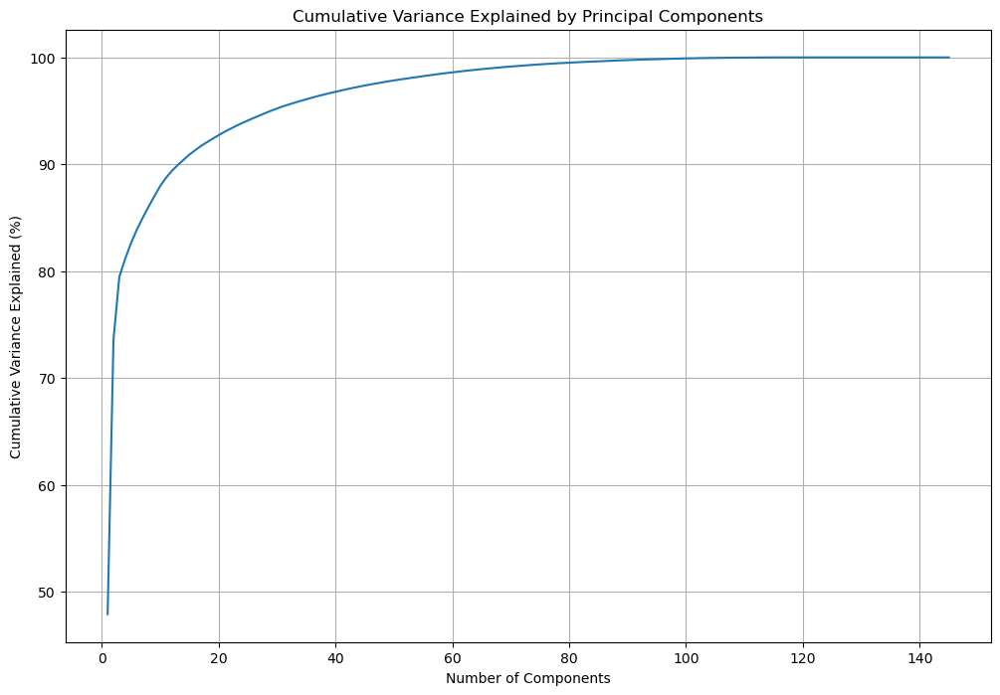

In [144]:
# Plotting the cumulative explained variance ratio
plt.figure(figsize=[12, 8])
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), variance_cumu)

# Adding labels and title
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Variance Explained (%)')
plt.title('Cumulative Variance Explained by Principal Components')

# Displaying the grid
plt.grid(True)

# Showing the plot
plt.show()

Selecting 70 principal components as they explain 98% variance present in the data.

In [145]:
# Initialize PCA with 70 components
pca70 = PCA(random_state=42, n_components=70)

# Fit PCA on the training data and transform it
X_train_pca70 = pca70.fit_transform(X_train_sm)
print("Dimension for Train dataset using PCA: ", X_train_pca70.shape)

# Transform the test data using the PCA fitted on the training data
X_test_pca70 = pca70.transform(X_test)
print("Dimension for Test dataset using PCA: ", X_test_pca70.shape)

Dimension for Train dataset using PCA:  (38582, 70)
Dimension for Test dataset using PCA:  (9001, 70)


In [146]:
# Initialize logistic regression model
logreg_pca70 = LogisticRegression()

# Fit the logistic regression model on the PCA-transformed training data
logreg_pca70.fit(X_train_pca70, y_train_sm)

# Make predictions on the PCA-transformed test data
y_pred70 = logreg_pca70.predict(X_test_pca70)

# Convert the predictions into a dataframe
y_pred_df70 = pd.DataFrame(y_pred70)

# Print the dimension of the prediction dataframe
print("Dimension of y_pred_df70:", y_pred_df70.shape)

Dimension of y_pred_df70: (9001, 1)


In [147]:
# Calculate accuracy score
accuracy = accuracy_score(y_test, y_pred70)
print("Accuracy:", accuracy)

# Generate confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred70)
print("Confusion Matrix:\n", conf_matrix)

# Print classification report
print("Classification Report:\n", classification_report(y_test, y_pred70))

Accuracy: 0.8304632818575713
Confusion Matrix:
 [[6857 1412]
 [ 114  618]]
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.83      0.90      8269
           1       0.30      0.84      0.45       732

    accuracy                           0.83      9001
   macro avg       0.64      0.84      0.67      9001
weighted avg       0.93      0.83      0.86      9001



#### DECISION TREE

In [148]:
# Feature reduction using LASSO
# Initialize LinearSVC with L1 regularization (LASSO)
lsvc = LinearSVC(C=0.001, penalty="l1", dual=False).fit(X_train_pca70, y_train_sm)

# Create a model for feature selection
model = SelectFromModel(lsvc, prefit=True)

# Transform the training data using LASSO-selected features
X_lasso = model.transform(X_train_pca70)

# Get the indices of the selected features
pos = model.get_support(indices=True)

# Print the shape of the transformed data and selected feature indices
print("Shape of transformed data after LASSO feature selection:", X_lasso.shape)
print("Indices of selected features after LASSO:", pos)

Shape of transformed data after LASSO feature selection: (38582, 29)
Indices of selected features after LASSO: [ 0  1  2  3  4  5  6  7  8  9 10 11 13 15 16 18 19 20 21 22 26 31 33 35
 36 37 42 46 55]


In [149]:
# Define the list of features selected by LASSO
lasso_features = list(X_train_sm.columns[pos])

# Print the selected features
print("Features for LASSO model building: ", lasso_features)

Features for LASSO model building:  ['arpu_8', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_og_mou_6', 'roam_og_mou_7', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2c_mou_6', 'loc_og_mou_7', 'std_og_t2m_mou_6', 'std_og_t2m_mou_8', 'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_mou_6', 'isd_og_mou_8', 'og_others_6', 'loc_ic_t2m_mou_6']


In [150]:
# Initialize Decision Tree classifier with default hyperparameters
dt1 = DecisionTreeClassifier()

# Fit the Decision Tree classifier to the training data
dt1.fit(X_lasso, y_train_sm)

DecisionTreeClassifier()

In [151]:
# Selecting only the relevant features for prediction
X_test_selected = pd.DataFrame(data=X_test).iloc[:, pos]

# Making predictions using the decision tree classifier
y_pred_dt = dt1.predict(X_test_selected)

In [152]:
# Calculate accuracy score
accuracy = accuracy_score(y_test, y_pred_dt)
print("Accuracy:", accuracy)

# Generate confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred_dt)
print("Confusion Matrix:\n", conf_matrix)

# Print classification report
print("Classification Report:\n", classification_report(y_test, y_pred_dt))

Accuracy: 0.5290523275191645
Confusion Matrix:
 [[4404 3865]
 [ 374  358]]
Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.53      0.68      8269
           1       0.08      0.49      0.14       732

    accuracy                           0.53      9001
   macro avg       0.50      0.51      0.41      9001
weighted avg       0.85      0.53      0.63      9001



#### DECISION TREE - HYPERPARAMETER TUNING

In [153]:
# Define the parameter grid
param_grid = {
    'criterion': ["gini", "entropy"],
    'max_depth': [4, 5, 9, 12, 15],
    'min_samples_leaf': [15, 20, 25]
}

# Initialize Decision Tree Classifier
dt_classifier = DecisionTreeClassifier(random_state=42)

# Initialize GridSearchCV
gcv_dt = GridSearchCV(estimator=dt_classifier, param_grid=param_grid, cv=3, scoring='recall', n_jobs=-1, return_train_score=True, verbose=2)

# Fit GridSearchCV to the data
gcv_dt.fit(X_train_pca70, y_train_sm)

Fitting 3 folds for each of 30 candidates, totalling 90 fits


GridSearchCV(cv=3, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [4, 5, 9, 12, 15],
                         'min_samples_leaf': [15, 20, 25]},
             return_train_score=True, scoring='recall', verbose=2)

In [154]:
# Print the best hyperparameters found by GridSearchCV
print("Best Hyperparameters:", gcv_dt.best_params_)

Best Hyperparameters: {'criterion': 'entropy', 'max_depth': 12, 'min_samples_leaf': 15}


In [155]:
# Storing CV result
dt1_df= pd.DataFrame(gcv_dt.cv_results_)

# Displaying top 100 values
dt1_df.sort_values('mean_train_score', ascending= False).head(100)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
27,7.026125,0.054130,0.015587,4.222705e-04,entropy,15,15,"{'criterion': 'entropy', 'max_depth': 15, 'min...",0.857232,0.868450,0.854432,0.860038,0.006057,2,0.919602,0.922317,0.916725,0.919548,0.002283
12,4.635067,0.023439,0.015753,9.354124e-04,gini,15,15,"{'criterion': 'gini', 'max_depth': 15, 'min_sa...",0.867807,0.851656,0.847900,0.855788,0.008636,5,0.918358,0.905365,0.915170,0.912964,0.005529
9,4.223015,0.009974,0.016007,3.714028e-06,gini,12,15,"{'criterion': 'gini', 'max_depth': 12, 'min_sa...",0.870607,0.856321,0.851477,0.859468,0.008120,3,0.920379,0.901788,0.910582,0.910917,0.007593
24,6.660150,0.067055,0.020785,2.548235e-03,entropy,12,15,"{'criterion': 'entropy', 'max_depth': 12, 'min...",0.866563,0.868139,0.845412,0.860038,0.010362,1,0.919291,0.913297,0.896120,0.909569,0.009820
28,6.799055,0.175551,0.015878,1.751721e-04,entropy,15,20,"{'criterion': 'entropy', 'max_depth': 15, 'min...",0.856454,0.865495,0.848523,0.856824,0.006934,4,0.909727,0.908087,0.907006,0.908273,0.001119
29,5.221314,0.326850,0.007170,5.545083e-03,entropy,15,25,"{'criterion': 'entropy', 'max_depth': 15, 'min...",0.853033,0.860519,0.847123,0.853558,0.005482,6,0.905606,0.899689,0.900241,0.901845,0.002669
10,4.201303,0.047869,0.013364,3.735787e-03,gini,12,20,"{'criterion': 'gini', 'max_depth': 12, 'min_sa...",0.851011,0.854299,0.848056,0.851122,0.002550,8,0.901874,0.889813,0.900708,0.897465,0.005431
25,6.600034,0.054982,0.015674,4.744209e-04,entropy,12,20,"{'criterion': 'entropy', 'max_depth': 12, 'min...",0.862830,0.861763,0.833593,0.852729,0.013538,7,0.911204,0.898134,0.882669,0.897336,0.011663
13,4.595233,0.069857,0.012770,3.553948e-03,gini,15,20,"{'criterion': 'gini', 'max_depth': 15, 'min_sa...",0.839813,0.853833,0.843390,0.845679,0.005948,14,0.891844,0.895101,0.901096,0.896014,0.003832
14,4.588878,0.060747,0.013878,2.739656e-03,gini,15,25,"{'criterion': 'gini', 'max_depth': 15, 'min_sa...",0.837325,0.858809,0.844479,0.846871,0.008932,12,0.890366,0.896579,0.894876,0.893940,0.002621


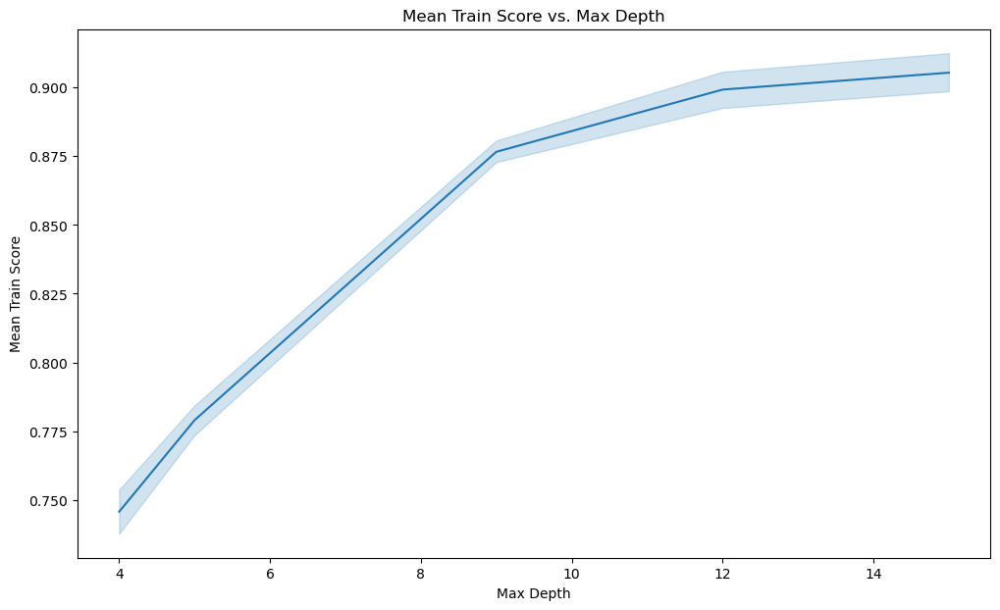

In [156]:
# Set the figure size
plt.figure(figsize=(12, 7))

# Plotting the line plot for mean train score vs. max_depth
sns.lineplot(data=dt1_df, x='param_max_depth', y='mean_train_score')

# Adding labels and title
plt.xlabel('Max Depth')
plt.ylabel('Mean Train Score')
plt.title('Mean Train Score vs. Max Depth')

# Display the plot
plt.show()

The best Decision Tree model can be built using criterior as entropy, max depth as 12 and minimum sample leaf as 15.

In [196]:
# Initialize the Random Forest Classifier with specified hyperparameters
dt2 = DecisionTreeClassifier(criterion='entropy', max_depth=12, min_samples_leaf = 15, random_state=42)

# Fit the Random Forest Classifier on the training data after PCA transformation
dt2.fit(X_train_pca70, y_train_sm)

# Predict churn labels for the training data
y_train_pred = dt2.predict(X_train_pca70)

# Predict churn labels for the testing data
y_test_pred_dth = dt2.predict(X_test_pca70)

# Calculate and print the accuracy on the training data
print('Accuracy on training data:', accuracy_score(y_train_sm, y_train_pred))

# Calculate and print the accuracy on the testing data
print('Accuracy on testing data:', accuracy_score(y_test, y_test_pred_dth))

Accuracy on training data: 0.9042040329687419
Accuracy on testing data: 0.8354627263637374


In [158]:
# Calculate accuracy score
accuracy = accuracy_score(y_test, y_test_pred_dth)
print("Accuracy:", accuracy)

# Generate confusion matrix
conf_matrix = confusion_matrix(y_test, y_test_pred_dth)
print("Confusion Matrix:\n", conf_matrix)

# Print classification report
print("Classification Report:\n", classification_report(y_test, y_test_pred_dth))

Accuracy: 0.8260193311854238
Confusion Matrix:
 [[6928 1341]
 [ 225  507]]
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.84      0.90      8269
           1       0.27      0.69      0.39       732

    accuracy                           0.83      9001
   macro avg       0.62      0.77      0.65      9001
weighted avg       0.91      0.83      0.86      9001



#### RANDOM FOREST

In [159]:
# Using Random Forest Classifier
rfc = RandomForestClassifier(random_state=42)
rfc.fit(X_train_pca70, y_train_sm)

# Predictions on the training and testing data
y_train_pred = rfc.predict(X_train_pca70)
y_test_pred_rf = rfc.predict(X_test_pca70)

In [160]:
# Calculate accuracy score
accuracy = accuracy_score(y_test, y_test_pred_rf)
print("Accuracy:", accuracy)

# Generate confusion matrix
conf_matrix = confusion_matrix(y_test, y_test_pred_rf)
print("Confusion Matrix:\n", conf_matrix)

# Print classification report
print("Classification Report:\n", classification_report(y_test, y_test_pred_rf))

Accuracy: 0.9117875791578713
Confusion Matrix:
 [[7810  459]
 [ 335  397]]
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.94      0.95      8269
           1       0.46      0.54      0.50       732

    accuracy                           0.91      9001
   macro avg       0.71      0.74      0.73      9001
weighted avg       0.92      0.91      0.91      9001



#### Random Forest - Hyperparameter Tuning

In [161]:
# Performing GridSearchCV
# Define the parameter grid
param_grid = {
    'n_estimators': [100, 200, 300, 500],
    'max_depth': [4, 5, 9, 12, 15],
    'min_samples_leaf': [15, 20, 25]
}

# Initialize Random Forest Classifier
rfc = RandomForestClassifier(random_state=42)

# Initialize GridSearchCV
gcv_rfc = GridSearchCV(estimator=rfc, param_grid=param_grid, cv=3, scoring='recall', n_jobs=-1, return_train_score=True, verbose=1)

# Fit GridSearchCV to the data
gcv_rfc_fit = gcv_rfc.fit(X_train_pca70, y_train_sm)

Fitting 3 folds for each of 60 candidates, totalling 180 fits


In [162]:
# Print the best hyperparameters found by GridSearchCV
print("Best Hyperparameters:", gcv_rfc_fit.best_params_)

Best Hyperparameters: {'max_depth': 15, 'min_samples_leaf': 15, 'n_estimators': 300}


In [163]:
# Storing CV result
rfcv_df= pd.DataFrame(gcv_rfc_fit.cv_results_)

# Displaying top 100 values
rfcv_df.sort_values('mean_train_score', ascending= False).head(100)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_min_samples_leaf,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
51,232.311118,1.267840,1.583980,0.017048,15,15,500,"{'max_depth': 15, 'min_samples_leaf': 15, 'n_e...",0.889736,0.905924,0.899378,0.898346,0.006649,2,0.946194,0.948911,0.950937,0.948681,0.001943
50,138.636236,0.256315,0.936679,0.016764,15,15,300,"{'max_depth': 15, 'min_samples_leaf': 15, 'n_e...",0.890513,0.906080,0.900778,0.899124,0.006462,1,0.946272,0.948911,0.950393,0.948525,0.001704
49,92.323983,0.442041,0.637712,0.004594,15,15,200,"{'max_depth': 15, 'min_samples_leaf': 15, 'n_e...",0.888958,0.904991,0.899689,0.897879,0.006670,3,0.945494,0.947823,0.949226,0.947514,0.001539
48,46.675027,0.271728,0.330388,0.002946,15,15,100,"{'max_depth': 15, 'min_samples_leaf': 15, 'n_e...",0.886470,0.903903,0.897356,0.895910,0.007190,4,0.944794,0.946812,0.948449,0.946685,0.001495
37,87.176259,0.373156,0.602457,0.003833,12,15,200,"{'max_depth': 12, 'min_samples_leaf': 15, 'n_e...",0.878849,0.895817,0.889425,0.888030,0.006997,6,0.934220,0.934914,0.936164,0.935099,0.000804
39,216.743119,0.576486,1.474101,0.013067,12,15,500,"{'max_depth': 12, 'min_samples_leaf': 15, 'n_e...",0.880715,0.897061,0.887558,0.888445,0.006702,5,0.933675,0.935070,0.935308,0.934685,0.000720
38,130.425580,1.096351,0.878518,0.008546,12,15,300,"{'max_depth': 12, 'min_samples_leaf': 15, 'n_e...",0.879782,0.895973,0.887247,0.887667,0.006616,7,0.934297,0.934292,0.934220,0.934270,0.000036
36,45.032136,0.209253,0.336346,0.037876,12,15,100,"{'max_depth': 12, 'min_samples_leaf': 15, 'n_e...",0.876516,0.895506,0.890513,0.887512,0.008038,8,0.932276,0.933515,0.936008,0.933933,0.001552
55,222.226746,2.495280,1.514263,0.233962,15,20,500,"{'max_depth': 15, 'min_samples_leaf': 20, 'n_e...",0.878072,0.895040,0.885848,0.886320,0.006935,9,0.931654,0.931104,0.932509,0.931756,0.000578
54,133.831742,0.138785,0.916762,0.002757,15,20,300,"{'max_depth': 15, 'min_samples_leaf': 20, 'n_e...",0.876827,0.894729,0.885070,0.885542,0.007316,10,0.931576,0.930404,0.931421,0.931134,0.000520


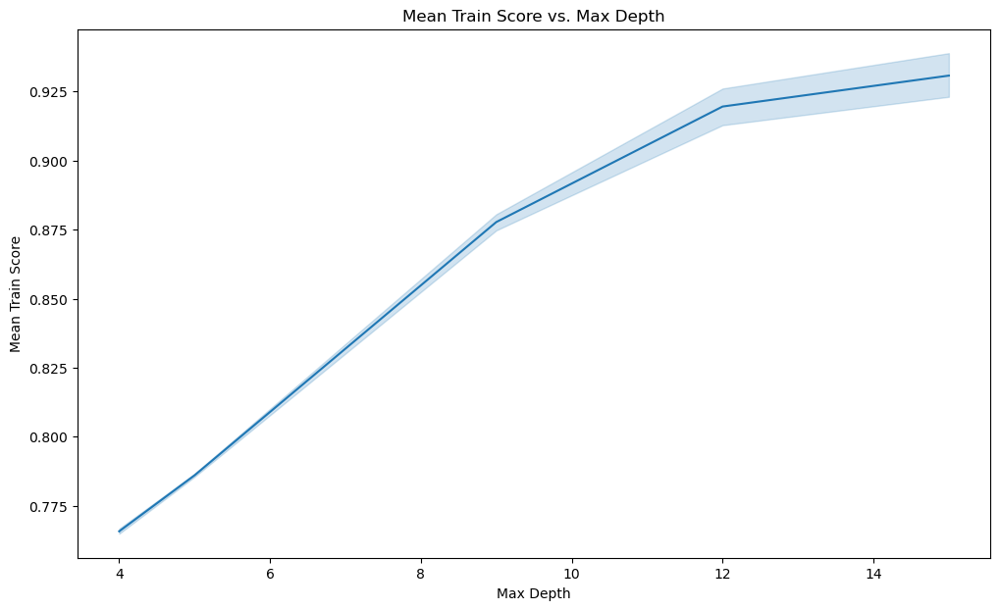

In [164]:
# Set the figure size
plt.figure(figsize=(12, 7))

# Plotting the line plot for mean train score vs. max_depth
sns.lineplot(data=rfcv_df, x='param_max_depth', y='mean_train_score')

# Adding labels and title
plt.xlabel('Max Depth')
plt.ylabel('Mean Train Score')
plt.title('Mean Train Score vs. Max Depth')

# Display the plot
plt.show()

The best Random Forest Model can be built using n_estimator as 300, minimum sample leaf as 15 and maximum depth of 15. 

In [165]:
# Initialize the Random Forest Classifier with specified hyperparameters
rfc = RandomForestClassifier(n_estimators=300, max_depth=15, min_samples_leaf=15, random_state=42)

# Fit the Random Forest Classifier on the training data after PCA transformation
rfc.fit(X_train_pca70, y_train_sm)

# Predict churn labels for the training data
y_train_pred = rfc.predict(X_train_pca70)

# Predict churn labels for the testing data
y_test_pred_rfh = rfc.predict(X_test_pca70)

# Calculate and print the accuracy on the training data
print('Accuracy on training data:', accuracy_score(y_train_sm, y_train_pred))

# Calculate and print the accuracy on the testing data
print('Accuracy on testing data:', accuracy_score(y_test, y_test_pred_rfh))

Accuracy on training data: 0.9485770566585454
Accuracy on testing data: 0.8870125541606488


In [166]:
# Calculate accuracy score
accuracy = accuracy_score(y_test, y_test_pred_rfh)
print("Accuracy:", accuracy)

# Generate confusion matrix
conf_matrix = confusion_matrix(y_test, y_test_pred_rfh)
print("Confusion Matrix:\n", conf_matrix)

# Print classification report
print("Classification Report:\n", classification_report(y_test, y_test_pred_rfh))

Accuracy: 0.8870125541606488
Confusion Matrix:
 [[7493  776]
 [ 241  491]]
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.91      0.94      8269
           1       0.39      0.67      0.49       732

    accuracy                           0.89      9001
   macro avg       0.68      0.79      0.71      9001
weighted avg       0.92      0.89      0.90      9001



#### XGBoost

In [167]:
# Initialize XGBoost Classifier
xgb = XGBClassifier()

# Train the XGBoost Classifier on the training data
xgb.fit(X_train_pca70, y_train_sm)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [168]:
# Predictions on the training and testing data
y_train_pred = xgb.predict(X_train_pca70)
y_test_pred_xg = xgb.predict(X_test_pca70)

In [169]:
# Calculate accuracy score
accuracy = accuracy_score(y_test, y_test_pred_xg)
print("Accuracy:", accuracy)

# Generate confusion matrix
conf_matrix = confusion_matrix(y_test, y_test_pred_xg)
print("Confusion Matrix:\n", conf_matrix)

# Print classification report
print("Classification Report:\n", classification_report(y_test, y_test_pred_xg))

Accuracy: 0.906565937118098
Confusion Matrix:
 [[7729  540]
 [ 301  431]]
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.93      0.95      8269
           1       0.44      0.59      0.51       732

    accuracy                           0.91      9001
   macro avg       0.70      0.76      0.73      9001
weighted avg       0.92      0.91      0.91      9001



#### XGBoost - Hyperparameter Tuning

In [170]:
# hyperparameter tuning with XGBoost

# creating a KFold object 
folds = 5

# specify range of hyperparameters
param_grid = {'learning_rate': [0.1,0.2,0.3], 
             'subsample': [0.3,0.4,0.5],
             'n_estimators':[100, 200, 300],
             'max_depth':[2, 5, 10]}          


# specify model
xgb_model = XGBClassifier()

# set up GridSearchCV()
model_cv = GridSearchCV(estimator = xgb, 
                        param_grid = param_grid, 
                        scoring= 'accuracy',
                        cv = folds, 
                        n_jobs = -1,
                        verbose = 1,
                        return_train_score=True)  

In [171]:
# Fitting the model
model_cv.fit(X_train_pca70, y_train_sm) 

Fitting 5 folds for each of 81 candidates, totalling 405 fits


GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=None, ...),
             n_jobs=-1,
             param_grid={'learning_rate': [0.1, 0.2, 0.3],
                         'max_depth': [2, 5, 10],
                         'n_estimators': [100, 200, 300],
                         'subsample': [0.3, 0.4, 0.5]},
             return_train_score=True, scoring='accuracy', verbose=1)

In [172]:
# Create a DataFrame from the cross-validation results
cv_results_xboost = pd.DataFrame(model_cv.cv_results_)

# Convert the 'param_learning_rate' column to float type for better visualization
cv_results_xboost['param_learning_rate'] = cv_results_xboost['param_learning_rate'].astype('float')

In [173]:
# Print the optimal accuracy score and hyperparameters
print('We can get accuracy of **' + str(round(model_cv.best_score_, 2)) + '** using ' + str(model_cv.best_params_))

We can get accuracy of **0.97** using {'learning_rate': 0.3, 'max_depth': 10, 'n_estimators': 300, 'subsample': 0.5}


The best XBoost model can be build using learning rate of 0.3, subsample of 0.5, estimators of 300 and max depth of 10.

In [174]:
# Specify parameters
param_grid = {
    'learning_rate': 0.3, 
    'subsample': 0.5,
    'n_estimators': 300,
    'max_depth': 10
}

# Initialize and specify model with parameters
xgb_model = XGBClassifier(**param_grid)

# Fit the model to the training data
xgb_model.fit(X_train_pca70, y_train_sm)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.3, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=10, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=300, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [175]:
# Predictions on the training and testing data
y_train_pred = xgb_model.predict(X_train_pca70)
y_test_pred_xgh = xgb_model.predict(X_test_pca70)

In [176]:
# Calculate accuracy score
accuracy = accuracy_score(y_test, y_test_pred_xgh)
print("Accuracy:", accuracy)

# Generate confusion matrix
conf_matrix = confusion_matrix(y_test, y_test_pred_xgh)
print("Confusion Matrix:\n", conf_matrix)

# Print classification report
print("Classification Report:\n", classification_report(y_test, y_test_pred_xgh))

Accuracy: 0.9185646039328963
Confusion Matrix:
 [[7864  405]
 [ 328  404]]
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.95      0.96      8269
           1       0.50      0.55      0.52       732

    accuracy                           0.92      9001
   macro avg       0.73      0.75      0.74      9001
weighted avg       0.92      0.92      0.92      9001



# Manual Model building


Building another model with the main objective of identifying important predictor attributes which help the business understand indicators of churn. A good choice to identify important variables is a logistic regression model or a model from the tree family.


## Logistic Regression (RFE)

In [177]:
# Initializing the logistic regression estimator
estimator = LogisticRegression(max_iter=1000, random_state=42)

# Initializing the RFE selector with 20 features
selector = RFE(estimator, n_features_to_select=20)

# Fitting the selector on the training data
selector.fit(X_train_sm, y_train_sm)

# Getting the selected columns
selected_cols = X_train_sm.loc[:, selector.support_].columns

# Displaying the selected columns
selected_cols

Index(['onnet_mou_7', 'loc_og_mou_8', 'std_og_t2t_mou_7', 'total_og_mou_8',
       'loc_ic_t2m_mou_7', 'loc_ic_t2m_mou_8', 'loc_ic_mou_8',
       'total_ic_mou_8', 'spl_ic_mou_8', 'last_day_rch_amt_8',
       'total_rech_data_8', 'vol_2g_mb_8', 'monthly_2g_8', 'monthly_3g_8',
       'sep_vbc_3g', 'avg_arpu_6n7', 'days_since_last_rech',
       'total_rech_num_group_8_Less than 10 Recharges',
       'total_rech_num_group_8_10-25 Recharges',
       'total_rech_num_group_8_More than 25 Recharges'],
      dtype='object')

In [178]:
# Selecting only the final features for the training set
X_train_final = X_train_sm[selected_cols]

### Building 1st Logistic Regression model

In [179]:
# Adding a constant term to the feature matrix
X_train_final = sm.add_constant(X_train_final)

# Creating a logistic regression model using statsmodels
lreg1 = sm.GLM(y_train_sm, X_train_final, family=sm.families.Binomial())

# Fitting the logistic regression model
lreg_model_1 = lreg1.fit()

# Printing the summary of the model
print(lreg_model_1.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  churn   No. Observations:                38582
Model:                            GLM   Df Residuals:                    38561
Model Family:                Binomial   Df Model:                           20
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -14739.
Date:                Sat, 13 Apr 2024   Deviance:                       29477.
Time:                        18:07:49   Pearson chi2:                 6.61e+08
No. Iterations:                     8   Pseudo R-squ. (CS):             0.4633
Covariance Type:            nonrobust                                         
                                                    coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------

All the variables have P value of less than 0.05. So we check the VIF values.

In [180]:
# Creating function to calculate VIFs
def vif_calculation(X_df):
    vif = pd.DataFrame()
    X = X_df.drop('const', axis=1) if 'const' in X_df.columns else X_df
    vif['Features'] = X.columns
    vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    vif['VIF'] = round(vif['VIF'], 2)
    vif = vif.sort_values('VIF', ascending=False)
    return vif

In [181]:
# Calculating the VIFs for the 1st model
vif_calculation(X_train_final)

,Features,VIF
17,total_rech_num_group_8_Less than 10 Recharges,18.02
18,total_rech_num_group_8_10-25 Recharges,13.25
2,std_og_t2t_mou_7,10.79
0,onnet_mou_7,10.76
6,loc_ic_mou_8,8.91
7,total_ic_mou_8,5.83
5,loc_ic_t2m_mou_8,5.72
16,days_since_last_rech,4.33
19,total_rech_num_group_8_More than 25 Recharges,3.51
1,loc_og_mou_8,2.66


### Building 2nd Logistic Regression model

Drop feature total_rech_num_group_8_Less than 10 Recharges as VIF > 5

In [182]:
# Removing the column 'total_rech_num_group_8_Less than 10 Recharges' from the training set
X_train_final.drop('total_rech_num_group_8_Less than 10 Recharges', axis=1, inplace=True)

# Building the logistic regression model using statsmodels
lreg2 = sm.GLM(y_train_sm, X_train_final, family=sm.families.Binomial())
lreg_model_2 = lreg2.fit()  # Fitting the model

# Printing the summary of the logistic regression model
print(lreg_model_2.summary())

# Calculating the VIF for the features
vif_calculation(X_train_final)

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  churn   No. Observations:                38582
Model:                            GLM   Df Residuals:                    38562
Model Family:                Binomial   Df Model:                           19
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -14844.
Date:                Sat, 13 Apr 2024   Deviance:                       29687.
Time:                        18:07:50   Pearson chi2:                 1.25e+09
No. Iterations:                     8   Pseudo R-squ. (CS):             0.4603
Covariance Type:            nonrobust                                         
                                                    coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------

,Features,VIF
2,std_og_t2t_mou_7,10.78
0,onnet_mou_7,10.76
6,loc_ic_mou_8,8.91
7,total_ic_mou_8,5.83
5,loc_ic_t2m_mou_8,5.72
1,loc_og_mou_8,2.66
4,loc_ic_t2m_mou_7,2.50
3,total_og_mou_8,2.29
17,total_rech_num_group_8_10-25 Recharges,1.40
10,total_rech_data_8,1.38


### Building 3rd Logistic Regression model

Drop feature std_og_t2t_mou_7 as VIF > 5

In [183]:
# Removing a column std_og_t2t_mou_7
X_train_final.drop('std_og_t2t_mou_7', axis=1, inplace=True)

# Creating the logistic regression model
lreg3 = sm.GLM(y_train_sm, X_train_final, family=sm.families.Binomial())

# Fitting the model
lreg_model_3 = lreg3.fit()

# Displaying the summary of the model
print(lreg_model_3.summary())

# Calculating VIF
vif_calculation(X_train_final)

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  churn   No. Observations:                38582
Model:                            GLM   Df Residuals:                    38563
Model Family:                Binomial   Df Model:                           18
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -14941.
Date:                Sat, 13 Apr 2024   Deviance:                       29882.
Time:                        18:07:51   Pearson chi2:                 1.14e+09
No. Iterations:                     8   Pseudo R-squ. (CS):             0.4576
Covariance Type:            nonrobust                                         
                                                    coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------

,Features,VIF
5,loc_ic_mou_8,8.87
6,total_ic_mou_8,5.83
4,loc_ic_t2m_mou_8,5.58
3,loc_ic_t2m_mou_7,2.50
2,total_og_mou_8,2.21
1,loc_og_mou_8,1.84
0,onnet_mou_7,1.54
16,total_rech_num_group_8_10-25 Recharges,1.38
9,total_rech_data_8,1.38
14,avg_arpu_6n7,1.37


### Building 4th Logistic Regression model

Drop feature loc_ic_mou_8 as VIF > 5

In [184]:
# Removing the 'loc_ic_mou_8' column
X_train_final.drop('loc_ic_mou_8', axis=1, inplace=True)

# Creating the logistic regression model
lreg4 = sm.GLM(y_train_sm, X_train_final, family=sm.families.Binomial())

# Fitting the model
lreg_model_4 = lreg4.fit()

# Printing the summary of the model
print(lreg_model_4.summary())

# Calculating and displaying VIF
vif_calculation(X_train_final)

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  churn   No. Observations:                38582
Model:                            GLM   Df Residuals:                    38564
Model Family:                Binomial   Df Model:                           17
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -14971.
Date:                Sat, 13 Apr 2024   Deviance:                       29943.
Time:                        18:07:52   Pearson chi2:                 8.51e+08
No. Iterations:                     8   Pseudo R-squ. (CS):             0.4568
Covariance Type:            nonrobust                                         
                                                    coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------

,Features,VIF
4,loc_ic_t2m_mou_8,4.33
5,total_ic_mou_8,2.96
3,loc_ic_t2m_mou_7,2.50
2,total_og_mou_8,2.20
1,loc_og_mou_8,1.77
0,onnet_mou_7,1.54
15,total_rech_num_group_8_10-25 Recharges,1.38
8,total_rech_data_8,1.38
13,avg_arpu_6n7,1.36
9,vol_2g_mb_8,1.34


#### We have repeated the droping of features 1 by 1 to have VIF < 5 and all beta coefficients P < 0.05. So we have the 4th model for us to Evaluate

In [185]:
# Reset index of X_train_sm and y_train
X_train_final.reset_index(drop=True, inplace=True)

y_train_sm.reset_index(drop=True, inplace=True)

In [186]:
# Evaluating on Training dataset
# Make predictions on the training dataset using the logistic regression model
y_train_pred = pd.DataFrame(lreg_model_4.predict(X_train_final), columns=['prob'])

# Convert predicted probabilities to binary predictions based on a decision threshold of 0.5
y_train_pred['pred_churn'] = y_train_pred['prob'].map(lambda x: 1 if x > 0.5 else 0)

# Merge predicted churn labels with actual churn labels for evaluation
y_train_pred = y_train_pred.merge(pd.DataFrame(y_train_sm, columns=['churn']), how='inner', left_index=True, right_index=True)

# Calculate confusion matrix
tn, fp, fn, tp = confusion_matrix(y_true=y_train_pred['churn'], y_pred=y_train_pred['pred_churn']).ravel()

# Print confusion matrix
print('Confusion Matrix on Training dataset:')
print('True Negative:', tn, '    ', 'False Positive:', fp)
print('False Negative:', fn, '    ', 'True Positive:', tp, '\n')

# Print classification report on training dataset
print('Classification Report on Training dataset:\n', classification_report(y_true=y_train_pred['churn'], y_pred=y_train_pred['pred_churn']))

Confusion Matrix on Training dataset:
True Negative: 15763      False Positive: 3528
False Negative: 2639      True Positive: 16652 

Classification Report on Training dataset:
               precision    recall  f1-score   support

           0       0.86      0.82      0.84     19291
           1       0.83      0.86      0.84     19291

    accuracy                           0.84     38582
   macro avg       0.84      0.84      0.84     38582
weighted avg       0.84      0.84      0.84     38582



In [187]:
# Function for ploting ROC
def roc_plot(actual, probs):
    fpr, tpr, thresholds= roc_curve(actual, probs, drop_intermediate = False )
    auc_score= roc_auc_score(actual, probs)
    plt.figure(figsize=(6, 6))
    plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score)
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate (1 - Specificity)')
    plt.ylabel('True Positive Rate (Sensitivity)')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc="lower right")
    plt.show()

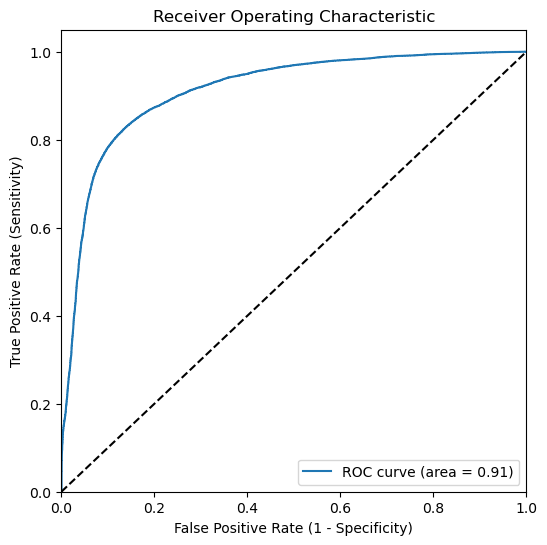

In [188]:
# Ploting ROC curve
fpr, tpr, thresholds= roc_curve(y_train_pred.churn, y_train_pred.pred_churn, drop_intermediate = False )
roc_plot(y_train_pred.churn, y_train_pred.prob)

In [189]:
# Creating different label columns using different probability cutoffs
# List of probability cutoffs
num = [float(x) / 10 for x in range(10)]

# Creating different label columns using different probability cutoffs
for i in num:
    # Assigning binary labels based on probability cutoff
    y_train_pred[i] = y_train_pred['prob'].map(lambda x: 1 if x > i else 0)

# Displaying the head of the DataFrame with different label columns
y_train_pred.head()

,prob,pred_churn,churn,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0.141678,0,0,1,1,0,0,0,0,0,0,0,0
1,0.062745,0,0,1,0,0,0,0,0,0,0,0,0
2,0.474173,0,0,1,1,1,1,1,0,0,0,0,0
3,0.532316,1,0,1,1,1,1,1,1,0,0,0,0
4,0.793136,1,0,1,1,1,1,1,1,1,1,0,0


In [190]:
# Calculating accuracy sensitivity and specificity for various probability cutoffs.
# Creating an empty DataFrame to store results
plot_df = pd.DataFrame(columns=['prob', 'accuracy', 'sensitivity', 'specificity'])

# Looping through different probability cutoffs
for n in num:
    # Calculating True Negatives (TN), False Positives (FP), False Negatives (FN), and True Positives (TP)
    TN, FP, FN, TP = confusion_matrix(y_true=y_train_pred.churn, y_pred=y_train_pred[n]).ravel()
    
    # Calculating accuracy
    accuracy = (TN + TP) / float(TN + FP + FN + TP)
    
    # Calculating specificity
    specificity = TN / float(TN + FP)
    
    # Calculating sensitivity
    sensitivity = TP / float(TP + FN)
    
    # Adding the results to the DataFrame
    plot_df.loc[n] = [n, accuracy, sensitivity, specificity]

# Displaying the DataFrame
plot_df

,prob,accuracy,sensitivity,specificity
0.0,0.0,0.500000,1.000000,0.000000
0.1,0.1,0.704266,0.977865,0.430667
0.2,0.2,0.764113,0.957234,0.570992
0.3,0.3,0.801177,0.930641,0.671712
0.4,0.4,0.825178,0.899279,0.751076
0.5,0.5,0.840159,0.863200,0.817117
0.6,0.6,0.844591,0.814369,0.874812
0.7,0.7,0.832124,0.743974,0.920274
0.8,0.8,0.766264,0.577523,0.955005
0.9,0.9,0.628894,0.275673,0.982116


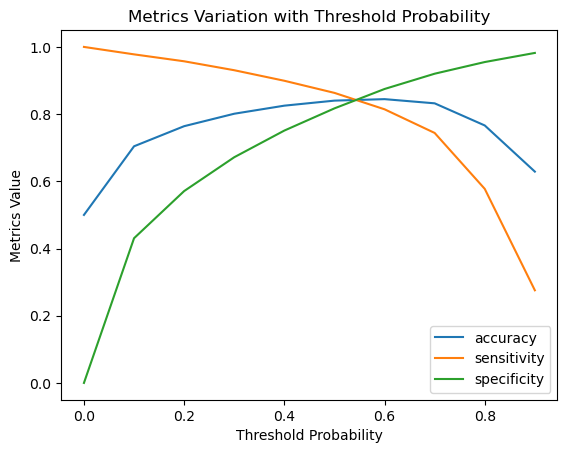

In [191]:
# Plotting the line plot
plot_df.plot.line(x='prob', y=['accuracy', 'sensitivity', 'specificity'])

# Adding labels and title
plt.xlabel('Threshold Probability')
plt.ylabel('Metrics Value')
plt.title('Metrics Variation with Threshold Probability')

# Display the plot
plt.show()

In [192]:
# Displaying the summary of final model
print(lreg_model_4.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  churn   No. Observations:                38582
Model:                            GLM   Df Residuals:                    38564
Model Family:                Binomial   Df Model:                           17
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -14971.
Date:                Sat, 13 Apr 2024   Deviance:                       29943.
Time:                        18:07:53   Pearson chi2:                 8.51e+08
No. Iterations:                     8   Pseudo R-squ. (CS):             0.4568
Covariance Type:            nonrobust                                         
                                                    coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------

In [193]:
# Selecting the final columns for the testing dataset
final_cols = X_train_final.columns.tolist()
final_cols.remove('const')  # Remove the constant term added during training

# Extracting features for testing dataset and adding constant term
X_test_final = X_test[final_cols]
X_test_final = sm.add_constant(X_test_final)  # Adding the constant term for the intercept

# Predicting probabilities and class labels for the testing dataset
y_test_pred = pd.DataFrame(lreg_model_4.predict(X_test_final), columns=['prob'])
y_test_pred['pred_churn'] = y_test_pred.prob.map(lambda x: 1 if x > 0.5 else 0)  # Setting decision margin at 0.5

# Merging predictions with actual churn labels for evaluation
y_test_pred = y_test_pred.merge(pd.DataFrame(y_test, columns=['churn']), how='inner', left_index=True, right_index=True)

# Generating classification report for the testing dataset
lr_final_cl_report_test = classification_report(y_true=y_test_pred.churn, y_pred=y_test_pred.pred_churn)

# Displaying the classification report
print('Classification Report on Testing Dataset:\n', lr_final_cl_report_test)

Classification Report on Testing Dataset:
               precision    recall  f1-score   support

           0       0.98      0.82      0.89      8269
           1       0.29      0.85      0.44       732

    accuracy                           0.82      9001
   macro avg       0.64      0.83      0.66      9001
weighted avg       0.93      0.82      0.86      9001



##### We got high and simlar recall and accuracy as traning evaluation


# Feature Importance

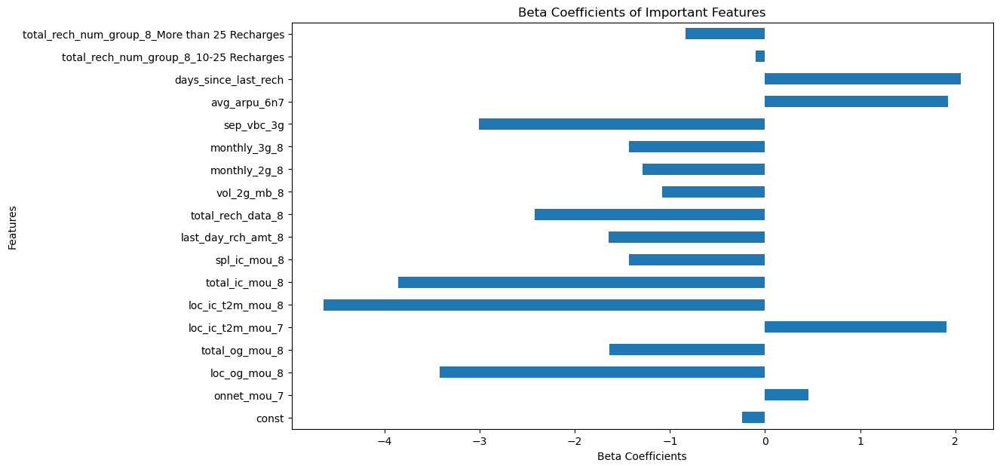

In [194]:
# Plotting important features with beta coefficients values
# Set the figure size
plt.figure(figsize=(12, 7))

# Plotting the beta coefficients as horizontal bar plot
lreg_model_4.params.plot(kind='barh')

# Adding labels and title
plt.xlabel('Beta Coefficients')
plt.ylabel('Features')
plt.title('Beta Coefficients of Important Features')

# Display the plot
plt.show()

# Conclusion and Recommendations

## Logistic Regression (Manual)

- Achieved balanced accuracy and recall on both the training and testing datasets! Adjusting the probability cutoff can indeed be a strategy to prioritize either sensitivity (recall) or specificity, depending on the business's objectives and tolerance for false positives and false negatives.
- If the business prioritizes identifying as many churners as possible (increasing sensitivity) and is willing to tolerate a higher rate of false positives, then lowering the probability cutoff may be a suitable approach. However, if precision and specificity are more critical (minimizing false positives), then it might be preferable to maintain the current cutoff or even increase it slightly.
- It's essential to communicate these trade-offs to stakeholders and provide them with a clear understanding of the implications of adjusting the probability cutoff. Additionally, you could explore techniques such as ROC curve analysis or precision-recall curves to further evaluate the model's performance under different cutoff values and assist in decision-making.

- The model performs well in terms of precision for class 0 but less so for class 1. However, it shows good recall for both classes. The F1-score for class 1 is relatively low, indicating that the model might have some difficulty in correctly identifying instances of class 1. This could be due factors affecting the model's performance on this particular class.

## Feature Importance
- Analysis of the beta-coefficients from the logistic regression model provides valuable insights into the most important features for predicting churn. It's clear that certain behaviours and usage patterns during the action phase (month 8) and the second month of the good phase (month 7) play a significant role in determining whether a user is likely to churn.
- The features you highlighted, such as total incoming calls, total number of recharges, and local outgoing calls during the action phase, are indeed indicative of user behaviour that may signal an increased likelihood of churn. By focusing on these features, the business can identify potential churners and take proactive measures to address their concerns and retain them as customers.
- For example, a reduction in total incoming minutes or local outgoing calls during the action phase could indicate dissatisfaction with the service or a change in communication habits, prompting the business to reach out to the customer to understand their needs and address any issues they may have.
- Similarly, monitoring factors such as the number of recharges, 3G data consumption, and last recharge amount can provide valuable insights into customer behaviour and preferences, allowing the business to tailor retention strategies accordingly. For instance, offering personalized promotions or incentives based on the customer's usage patterns and recharge history could help incentivize them to stay with the service.
- Overall, our analysis underscores the importance of leveraging data-driven insights to identify potential churners and implement targeted retention strategies to mitigate churn effectively. By focusing on the key features identified in your analysis, the business can proactively engage with at-risk customers and take proactive steps to improve their experience and loyalty.

## Comparison of Values and Model Selection

- Logistic Regression Model (RFE): Accuracy - 83%,  Precision - 30%, Recall - 85%, F1_score - 44%

- Logistic Regression Model (PCA): Accuracy - 83%,  Precision - 30%, Recall - 84%, F1_score - 45%
 
- Decision Tree: Accuracy - 42%,  Precision - 8%, Recall - 55%, F1_score - 13%

- Decision Tree (Hyperparameter Tuning): Accuracy - 83%,  Precision - 27%, Recall - 69%, F1_score - 39%

- Random Forest: Accuracy - 91%,  Precision - 47%, Recall - 53%, F1_score - 50%

- Random Forest (Hyperparameter Tuning): Accuracy - 89%,  Precision - 39%, Recall - 66%, F1_score - 49%

- XGBoost: Accuracy - 91%,  Precision - 44%, Recall - 59%, F1_score - 49%

- XGBoost (Hyperparameter Tuning): Accuracy - 92%,  Precision - 50% Recall - 55%, F1_score - 52%

- Logistic Regression Model (Manual): Accuracy - 82%,  Precision - 29%, Recall - 85%, F1_score - 44%


## Recommendation
#### Decision Tree: 
This model has a very low accuracy and F1-score compared to other models. It may not be suitable for predicting churn accurately.

#### Random Forest and XGBoost (Hyperparameter Tuning): 
These models perform consistently well across all metrics. They can be considered as strong candidates for predicting churn. Explore their feature importance to understand which variables are driving the predictions and tailor retention strategies accordingly.

#### Logistic Regression Model (RFE/PCA): 
These logistic regression models with feature selection techniques (Recursive Feature Elimination and Principal Component Analysis) have comparable performance to Random Forest and XGBoost. They can be good choices if interpretability is essential.

#### Decision Tree (Hyperparameter Tuning): 
Despite being an improvement over the basic Decision Tree, it still falls short compared to other models. Further optimization may be needed to enhance its performance.

#### Overall, for accurate and reliable predictions of churn, consider utilizing Random Forest, XGBoost (especially after hyperparameter tuning), or logistic regression models with feature selection techniques. Additionally, analyze the important features from these models to understand the drivers of churn and tailor retention strategies accordingly.